## Avocados

[Avocados](https://en.wikipedia.org/wiki/Avocado) are delicious.
They can be eaten by themselves, on toast, as part of a dip, or in a soup or milkshake.
They're full of fats, which make them a good substitute for animal fats such as butter.


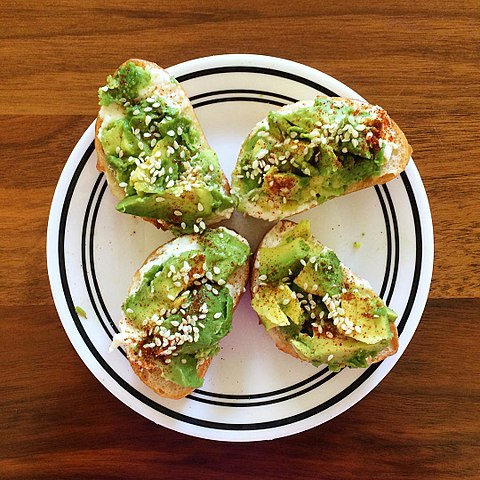

[CC-By-SA 4.0](https://creativecommons.org/licenses/by-sa/4.0/deed.en) by [Jami430](https://commons.wikimedia.org/wiki/User:Jami430) ([source](https://commons.wikimedia.org/wiki/File:Avocado_toast_-_four_pieces.jpg))

Avocados are also fast growing in popularity in the US with the consumption almost quadrupling from 2001 to 2018.

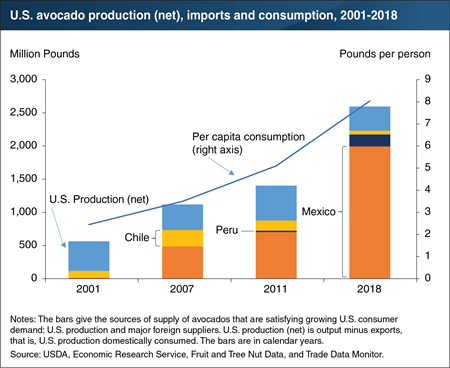
[Source USDA](https://www.ers.usda.gov/data-products/charts-of-note/charts-of-note/?topicId=b64476d3-203d-4eea-ad5c-59272f480979)

The most common Avocado is the [Hass](https://en.wikipedia.org/wiki/Hass_avocado), which accounts for [80% of all avocados eaten worldwide](https://web.archive.org/web/20080913165316/http://www.avocado.org/about/avocado-history/mother-tree), and are spread by [grafting](https://en.wikipedia.org/wiki/Grafting) the Hass plant back to a single tree grown from seed by Rudolph Hass in 1926.



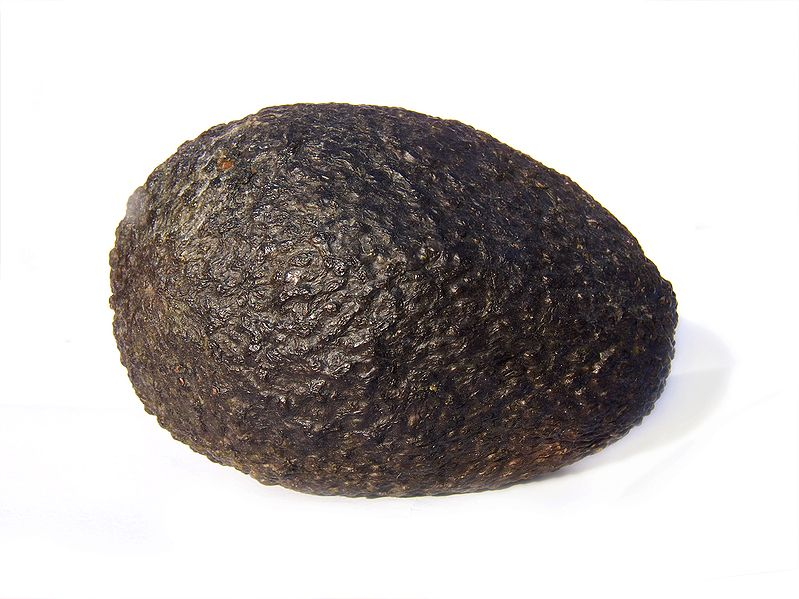

[CC-By-SA 3.0](https://creativecommons.org/licenses/by-sa/3.0/deed.en) by [Benjamint444](https://commons.wikimedia.org/wiki/User:Benjamint444) ([source](https://commons.wikimedia.org/wiki/File:Avacado444.jpg))

## Economics of Avocados

As the demand for avocados grows people are willing to pay for Avocados - but how much?

The [supply, demand and price](https://en.wikipedia.org/wiki/Supply_and_demand) for avocados are intimately linked.
Based on the quantity and price they can sell to retailers, and the financial resources available, growers are incentivised to produce to a certain number.
In turn the retailers who buy from the growers are incentivised to buy based on the quantity they can sell and the margin they make.

As demand increases for avocados both the price and supply goes up.

If there's a supply shortage (for example due to a drought, or logistical issues) then prices go up because the consumers who *really* want that avo smash are willing to pay a premium.

Conversely when there's a glut of avocados the price needs to go down or a lot of avocados are going to rot uneaten.

## Supply of avocados

Avocados grow best in subtropical regions, and require a lot of water - on average [283 L/kg of avocados](https://web.archive.org/web/20191007172453/https://old.danwatch.dk/en/undersogelseskapitel/how-much-water-does-it-take-to-grow-an-avocado/), but up to 1280 L.
This means they're sensitive to changes in available water supply.

They also grow best in subtropical conditions, and so like all agriculture supply is linked to climate.

They are picked before they ripen and typically [stored for 2-4 weeks](https://www.tis-gdv.de/tis_e/ware/obst/avocado/avocado-htm/) under controlled conditions, up to 6 weeks.
This short supply chain means logistic factors are very important.



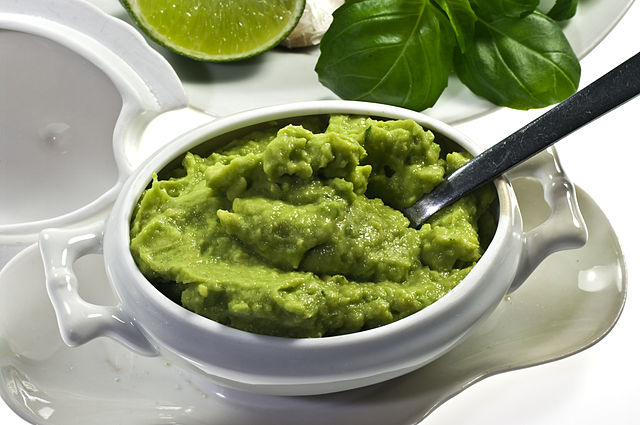


[CC-By-SA 4.0](https://creativecommons.org/licenses/by-sa/4.0/deed.en) by [Nikodem Nijaki](https://commons.wikimedia.org/wiki/User:Nikodem_Nijaki) ([source](https://commons.wikimedia.org/wiki/File:Guacamole_IMGP1271.jpg))

Data for supply can be found in [Food and Agriculture Organization of the United Nations](http://www.fao.org/faostat/en/#data/QC).

In the US the [USDA fruit and tree nuts data](https://www.ers.usda.gov/data-products/fruit-and-tree-nuts-data/fruit-and-tree-nuts-yearbook-tables/#Noncitrus%20Fruit) has annual statistics back to 1975:

* Noncitrus Fruit: production, price and value for California, Florida and the whole United States.
* Supply and Utilization:
* U.S. Trade: imports and exports

[California Avocado Growers Industry Statistical Data](https://www.californiaavocadogrowers.com/industry/industry-statistical-data)

## Demand Data

The [Hass Avocado Board](https://hassavocadoboard.com) coordinates growth and distribution of avocados in the US.
They also have lots of useful reports and datasets about Hass growth and sales which is where our analytics begins.

[They *used to*](https://web.archive.org/web/20180702225144/http://www.hassavocadoboard.com/retail/volume-and-price-data) provide statistics of weekly purchase volume and average price by region back to 2016, and for the whole country back to 2004. Someone uploaded the data by region [to Kaggle](https://www.kaggle.com/neuromusic/avocado-prices).
They've now made their site fancier but has a lot of useful statistics 2018 to present.


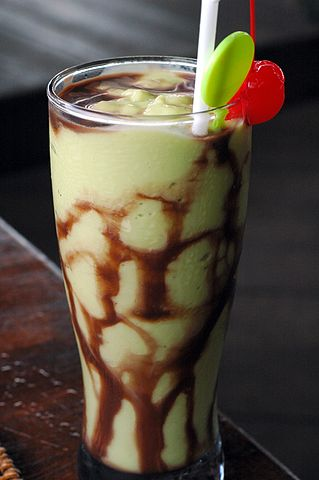

[CC-By-SA 3.0](https://creativecommons.org/licenses/by-sa/3.0/deed.en) by [Jpatokal](https://commons.wikimedia.org/wiki/User:Jpatokal) ([source](https://en.wikipedia.org/wiki/File:IndonesianFood_JusAlpokat.JPG))

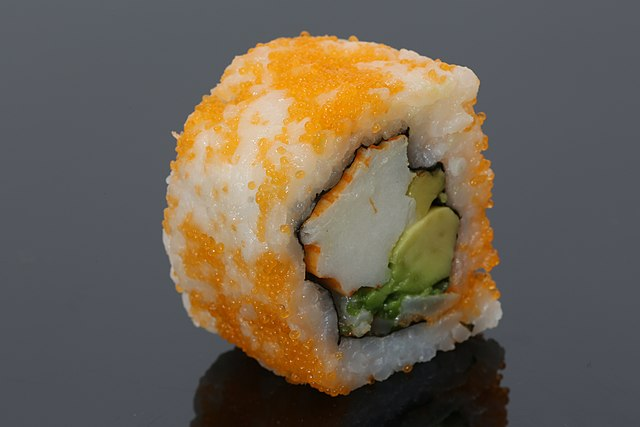

[CC 2.0](https://creativecommons.org/licenses/by/2.0/deed.en) by [Nikodem Nijaki](https://www.flickr.com/people/115225894@N07) ([source](https://commons.wikimedia.org/wiki/File:California_Sushi_\(26571101885\).jpg))

# Goals of this Analysis

Using the price and volume data of avocados I want to try to understand the price elasticity of avocados over time and location.
This data can address these goals by looking at the sales volume and the average price by time and location.
Most retailers and suppliers want to sell all their stock rather than waste it; if we assume they do we can estimate the sales volume as the actual volume available.
Under this assumption the average retail price is close to the market clearing price for avocados.

There's variation in the supply of avocados as producers  change their production and distribution to meet demand, and random variation due to changes in agricultural conditions.
I'm relying on this random variation to give insight into how the price changes as supply changes.

# Visualising the Data

In [1]:
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(ggformula))
suppressPackageStartupMessages(library(lubridate))
library(rstanarm)

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
Loading required package: Rcpp

This is rstanarm version 2.21.1

- See https://mc-stan.org/rstanarm/articles/priors for changes to default priors!

- Default priors may change, so it's safest to specify priors, even if equivalent to the defaults.

- For execution on a local, multicore CPU with excess RAM we recommend calling

  options(mc.cores = parallel::detectCores())



In [2]:
options(mc.cores = parallel::detectCores())

In [3]:
# Set the maximum number of columns and rows to display
options(repr.matrix.max.cols=150, repr.matrix.max.rows=200)
# Set the default plot size
options(repr.plot.width=18, repr.plot.height=12)

## Locations

From their map we can wrap up locations into 3 levels:

* Sales Region (e.g. Los Angeles)
* Market (e.g California)
* Country (Total U.S.)

https://web.archive.org/web/20171009185127/http://www.hassavocadoboard.com/retail/volume-and-price-data

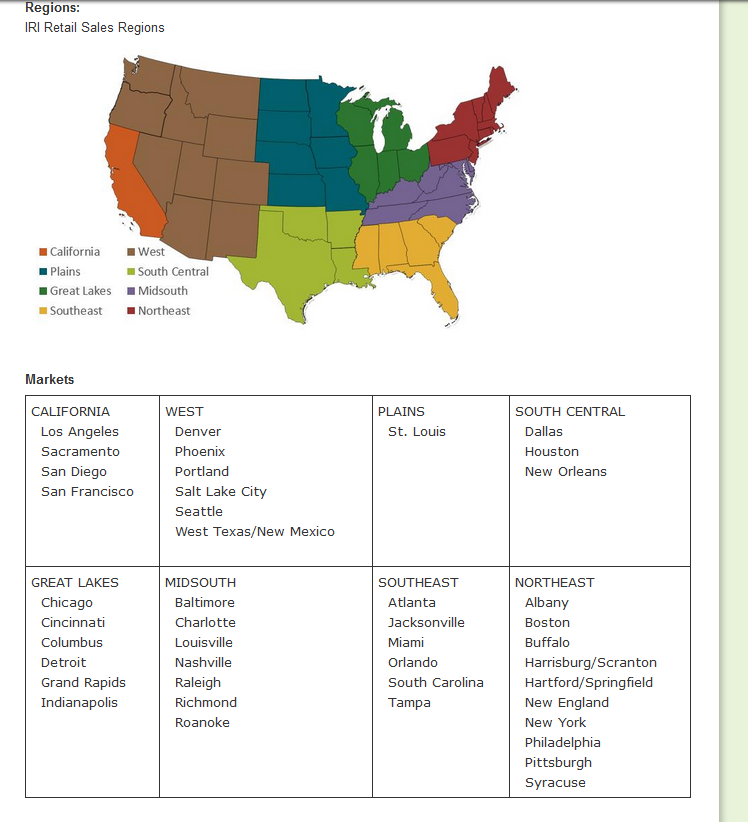

In [4]:
df_location <- tribble(
    ~geo, ~region, ~granularity,
    "Albany", "Northeast", 0,
    "Atlanta", "Southeast", 0,
    "Baltimore/Washington", "Midsouth", 0,
    "Boise", "West", 0,  
    "Boston", "Northeast", 0,
    "Buffalo/Rochester", "Northeast", 0,
    "California", "Total U.S.", 1,
    "Charlotte", "Midsouth", 0,
    "Chicago", "Great Lakes", 0,
    "Cincinnati/Dayton", "Great Lakes", 0,
    "Columbus", "Great Lakes", 0,
    "Dallas/Ft. Worth", "South Central", 0,
    "Denver", "West", 0,
    "Detroit", "Great Lakes", 0,
    "Grand Rapids", "Great Lakes", 0,
    "Great Lakes", "Total U.S.", 1,
    "Harrisburg/Scranton", "Northeast", 0,
    "Hartford/Springfield", "Northeast", 0,
    "Houston", "South Central", 0,
    "Indianapolis", "Great Lakes", 0,
   "Jacksonville", "Southeast", 0,
   "Las Vegas", "West", 0,
    "Los Angeles", "California", 0,
   "Louisville", "Midsouth", 0,
   "Miami/Ft. Lauderdale", "Southeast", 0,
   "Midsouth", "Total U.S.", 1,
   "Nashville", "Midsouth", 0,
   "New Orleans/Mobile", "South Central", 0,
   "New York", "Northeast", 0,
   "Northeast",  "Total U.S.", 1,
   "Northern New England", "Northeast", 0,
   "Orlando", "Southeast", 0,
   "Philadelphia", "Northeast", 0,
   "Phoenix/Tucson", "West", 0,
   "Pittsburgh", "Northeast", 0,
   "Plains",  "Total U.S.", 1,
   "Portland", "West", 0,
   "Raleigh/Greensboro", "Midsouth", 0,
  "Richmond/Norfolk", "Midsouth", 0,
 "Roanoke", "Midsouth", 0,
 "Sacramento", "California", 0,
 "San Diego", "California", 0,
 "San Francisco",  "California", 0,
 "Seattle", "West", 0,
 "South Carolina", "Southeast", 0,
 "South Central", "Total U.S.", 1,
 "Southeast", "Total U.S.", 1,
"Spokane", "West", 0,
"St. Louis", "Plains", 0,
"Syracuse", "Northeast", 0,
"Tampa", "Southeast", 0,
"Total U.S.", "Total U.S.", 2,
"West", "Total U.S.", 1,
"West Tex/New Mexico", "West", 0,
    )

df_location %>% arrange(desc(granularity))

geo,region,granularity
<chr>,<chr>,<dbl>
Total U.S.,Total U.S.,2
California,Total U.S.,1
Great Lakes,Total U.S.,1
Midsouth,Total U.S.,1
Northeast,Total U.S.,1
Plains,Total U.S.,1
South Central,Total U.S.,1
Southeast,Total U.S.,1
West,Total U.S.,1


In [5]:
california_states <- c("California")
west_states <- c("Washington", "Oregon", "Idaho", "Montana", "Wyoming",
                "Nevada", "Utah", "Colorado", "Arizona", "New Mexico")
plains_states <- c("North Dakota", "South Dakota", "Nebraska", "Kansas",
                  "Minnesota", "Iowa", "Missouri")
great_lakes_states <- c("Wisconsin", "Michigan", "Illinois",
                        "Indiana", "Ohio")
northeast_states <- c("Maine", "New Hampshire", "Vermont", "Massachuesetts",
                     "Rhode Island", "Connecticut", "New York", "New Jersey",
                     "Pennsylvania")
midsouth_states <- c("Delaware", "Maryland", "Virginia", "West Virginia",
                    "North Carolina", "Tennesee", "Kentucky")
southeast_states <- c("South Carolina", "Georgia", "Florida",
                     "Alabama", "Mississippi")
south_central_states <- c("Arkansas", "Louisiana", "Oklahoma", "Texas")

## Reading in the data

This lists a few [types of avocados](https://loveonetoday.com/how-to/identify-hass-avocados/):

* 4046 is a Small/Medium Hass Avocado (~3-5oz avocado)
* 4225 is a Large Hass Avocado (~8-10oz avocado)
* 4770 is a Extra Large Hass Avocado (~10-15oz avocado)
* Bags are of various sizes

In [6]:
avos <- read_csv("data/avocados.csv", 
              col_types = list(Year=col_double(),
                               Geography=col_character(),
                               `Current Year Week Ending` = col_date(format='%Y-%m-%d 00:00:00'),
                               Type=col_character(),
                              `Bulk GTIN`=col_double())) %>%
     rename(year = "Year",
            geo = "Geography",
           date = "Current Year Week Ending",
           type = "Type",
           price = "ASP Current Year",
           volume = "Total Bulk and Bags Units",
           volume_4046 = "4046 Units",
           volume_4225 = "4225 Units",
           volume_4770 = "4770 Units",
           volume_bag = "TotalBagged Units",
           volume_bag_small = "SmlBagged Units",
           volume_bag_large = "LrgBagged Units",
           volume_bag_xlarge = "X-LrgBagged Units") %>%
     mutate(type = as.factor(type),
            geo = as.factor(geo)) %>%
     left_join(df_location, by="geo") %>%
     group_by(geo, type) %>%
     mutate(delta_price = price - lag(price, order_by=date),
            delta_volume = volume - lag(volume, order_by=date)) %>%
     ungroup()

95% of the time the volumes add up:

volume = volume_4056 + volume_4225 + volume_4770 + volume_bag

And 99% of the time the bag volumes add up:

volume_bag = volume_bag_small + volume_bag_large + volume_bag_xlarge

In [7]:
avos %>% 
mutate(diff=volume - volume_4046 - volume_4225 - volume_4770 - volume_bag,
       bag_diff = volume_bag - volume_bag_small - volume_bag_large - volume_bag_xlarge) %>% 
summarise(volume_inconsistent_frac = mean(abs(diff) > 0.001),
          bag_inconsistent_frac = mean(abs(bag_diff) > 0.001))

volume_inconsistent_frac,bag_inconsistent_frac
<dbl>,<dbl>
0.2853918,0.181732


## Visualisations

### Price

Price over time per location by type.

There's quite a bit of variation and no obvious trend.
Organic avocados tend to be more expensive.

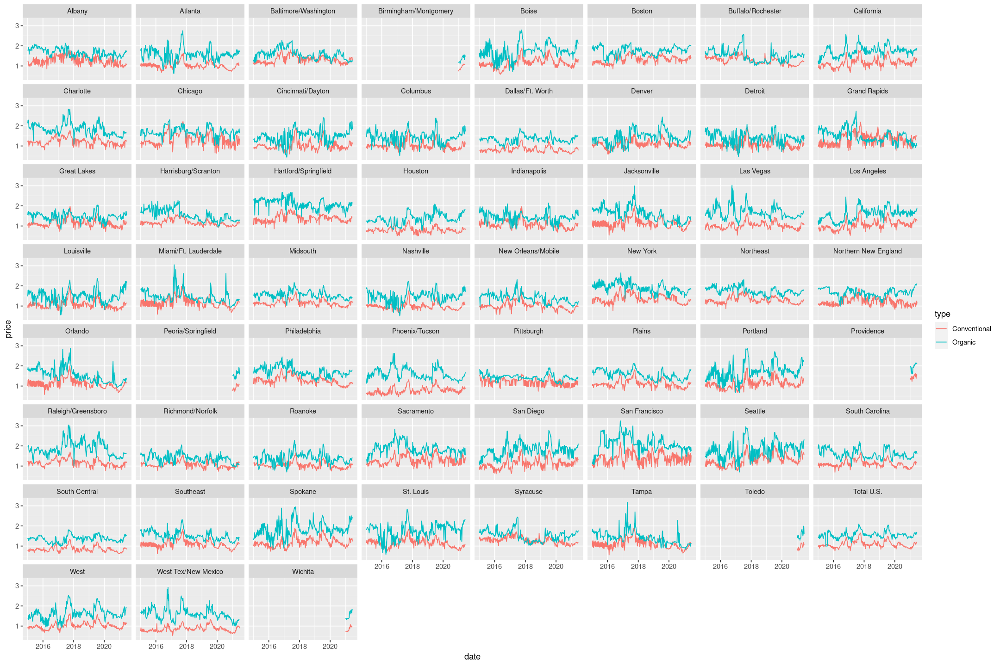

In [8]:
avos %>% gf_line(price ~ date | geo, col=~type)

Zooming in on Total US:

Something weird is happening to organic prices between June and September 2015.

There's a clear cyclical pattern, where prices peak around August-October. (which is likely to be the off season), except in 2020 (another impact of Covid?)

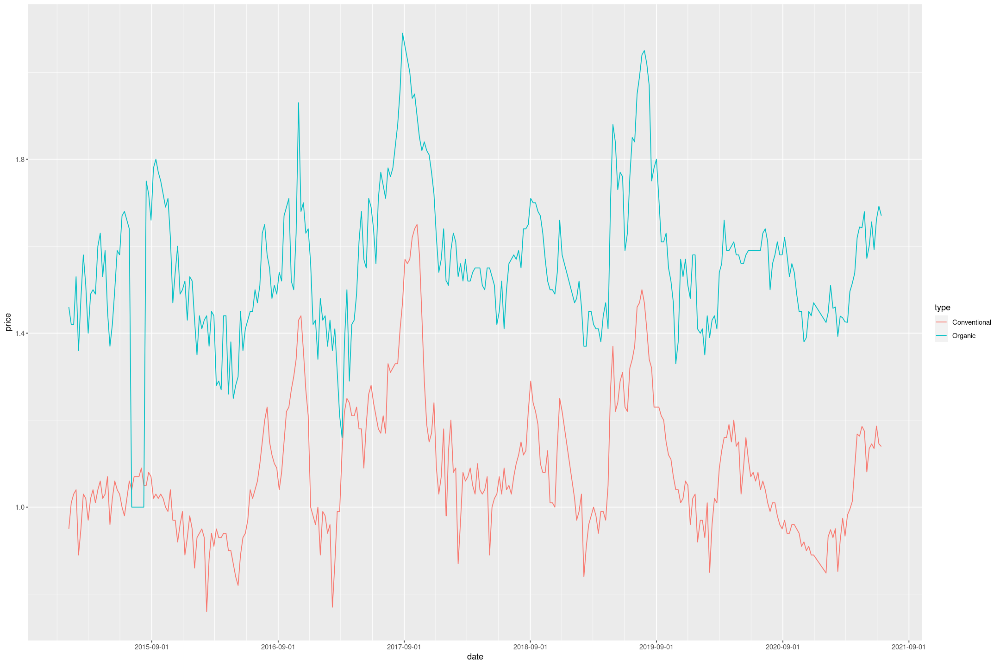

In [9]:
avos %>%
filter(geo == 'Total U.S.') %>% 
gf_line(price ~ date, col=~type) +
scale_x_date(date_breaks="12 months", 
             date_minor_breaks = "3 month")

### Volume

Volume sold at each location over time.

It looks like volume is going up over time, and organic sells a lot less than conventional.

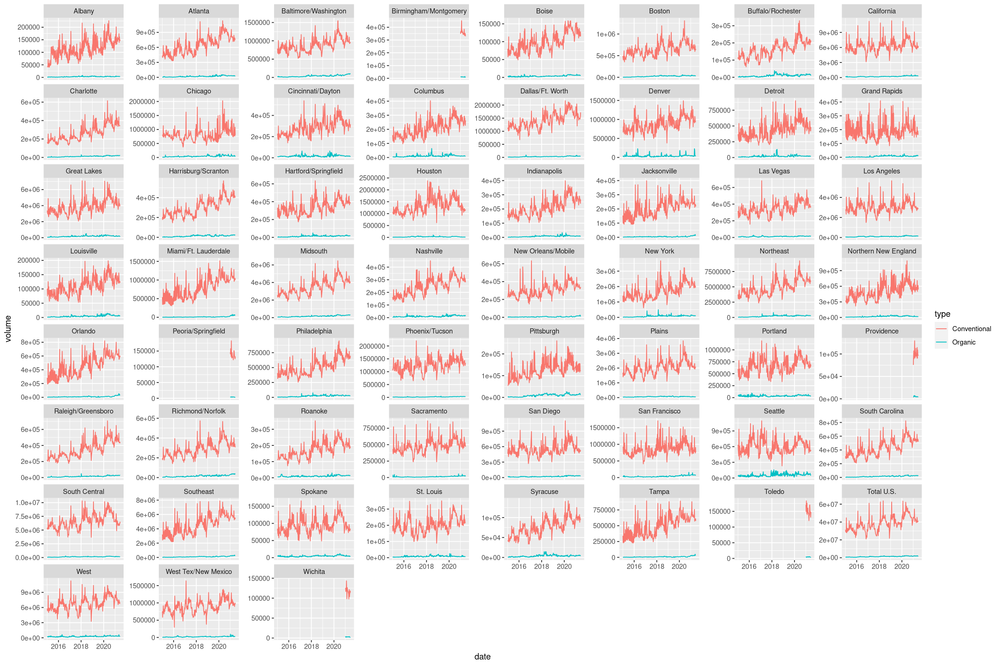

In [10]:
avos %>%
gf_line(volume ~ date, col=~type)  %>% 
gf_facet_wrap(~geo, scales="free_y")

Zooming in on Total US.

Volume is increasing over time with seasonal troughs around October (when price correspondingly rises).

Organic volume is much smaller but is growing much more rapidly.

In [11]:
US = 'Total U.S.'

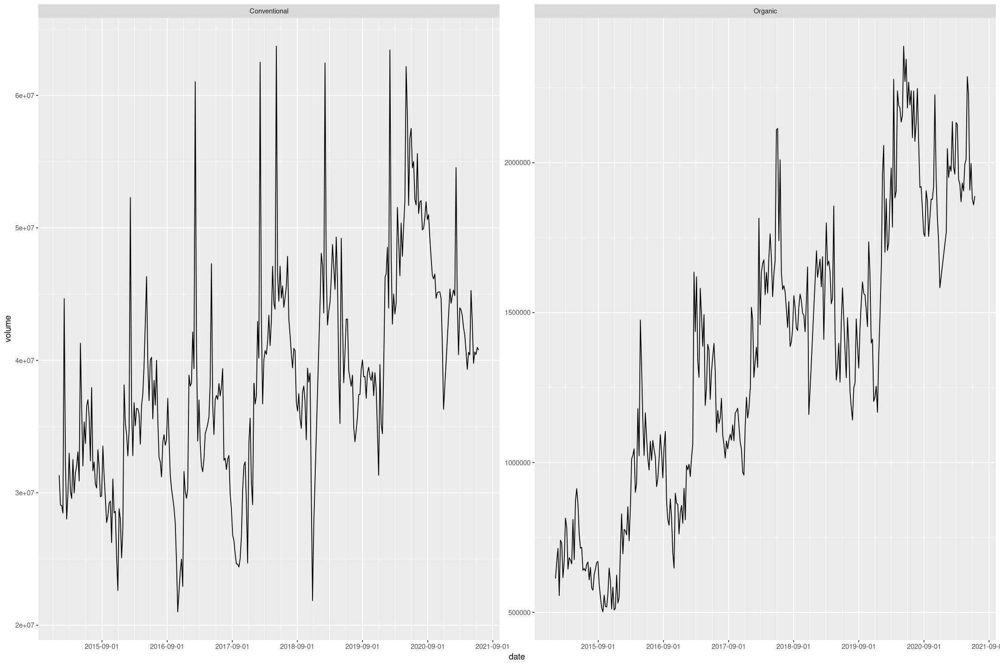

In [12]:
avos %>%
filter(geo == US) %>%
gf_line(volume ~ date) %>%
gf_facet_wrap(~type, scales="free_y") +
scale_x_date(date_breaks="12 months", 
             date_minor_breaks = "3 month")

### Price vs Volume

We can see an inverse relationship between price and volume as you would expect.

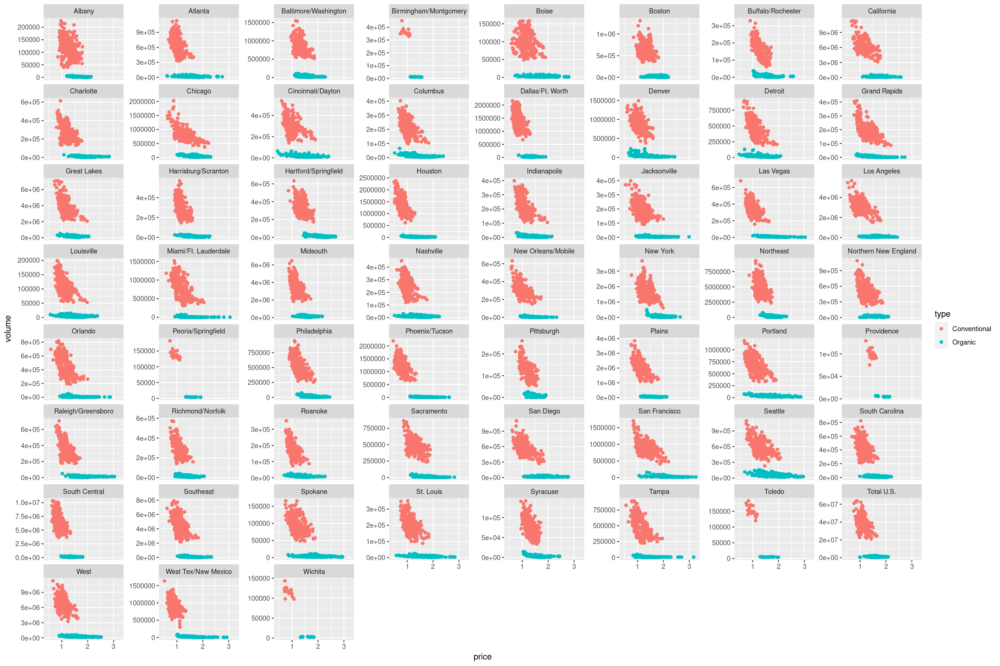

In [13]:
avos %>%
gf_point(volume ~ price, col=~type)  %>% 
gf_facet_wrap(~geo, scales="free_y")

Zooming in on total US

In most years you can see an inverse relationship between price and volume, but 2015 and 2020 stand out as a bit odd.

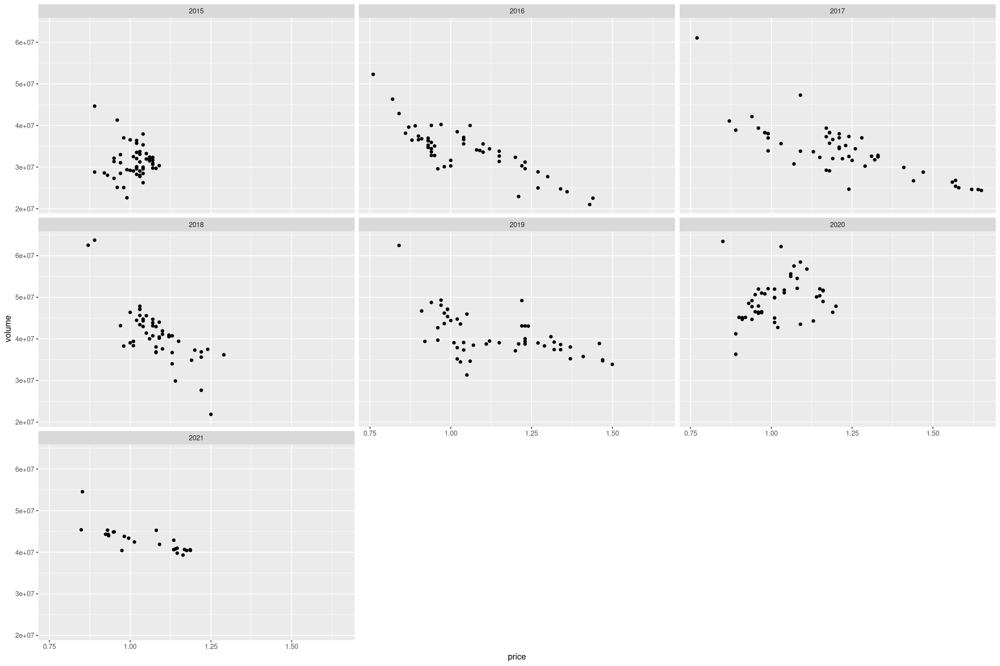

In [14]:
avos %>%
filter(type=="Conventional") %>%
mutate(year=as.ordered(year(date))) %>%
filter(geo == US) %>%
gf_point(volume ~ price) %>%
gf_facet_wrap(~year)

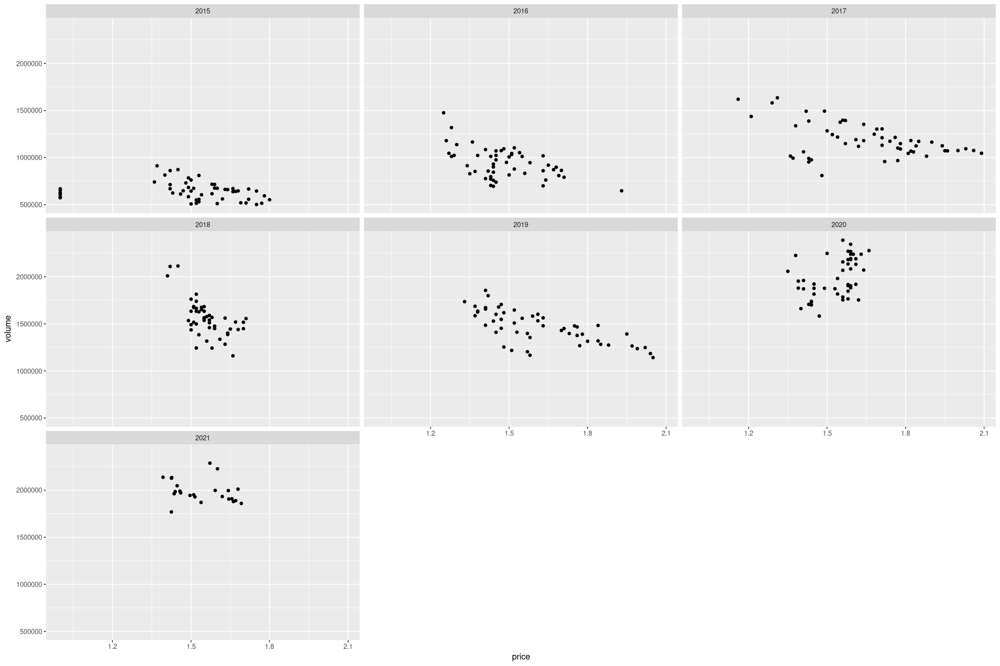

In [15]:
avos %>%
filter(type=="Organic") %>%
mutate(year=as.ordered(year(date))) %>%
filter(geo == US) %>%
gf_point(volume ~ price) %>%
gf_facet_wrap(~year)

## Delta Volume and Price

Noisy around 0

Warning message:
“Removed 2 row(s) containing missing values (geom_path).”


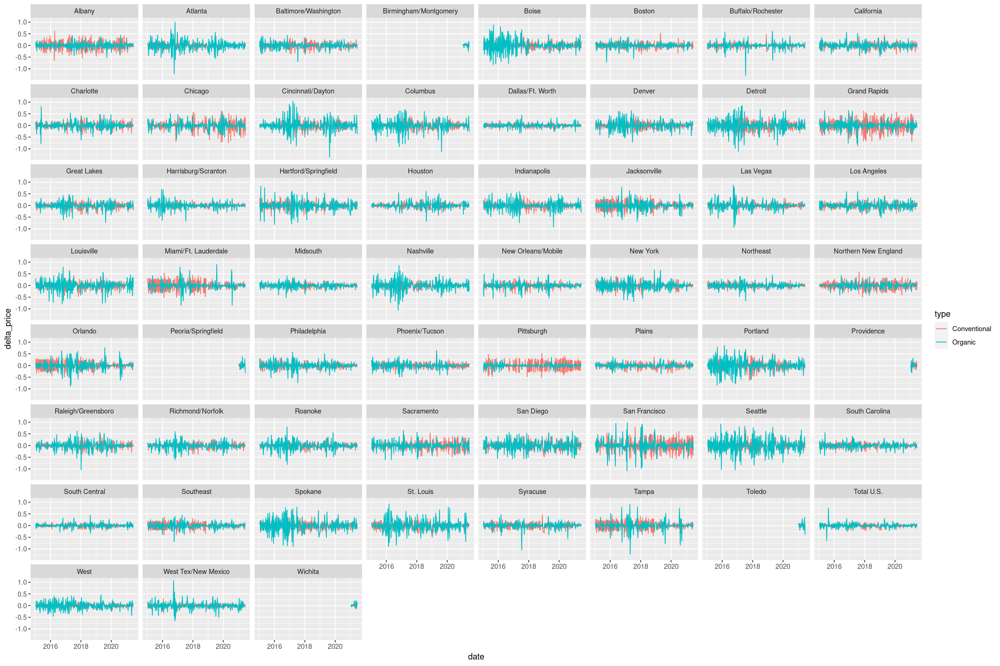

In [16]:
avos %>%
gf_line(delta_price ~ date | geo, col=~type)

Warning message:
“Removed 1 row(s) containing missing values (geom_path).”


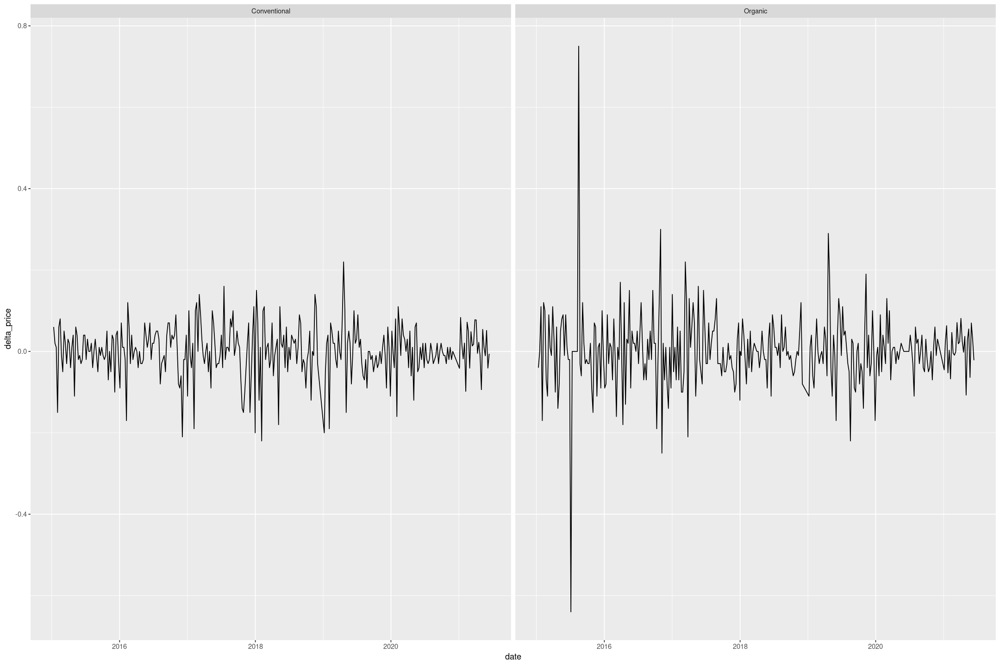

In [17]:
avos %>%
filter(geo == US) %>%
gf_line(delta_price ~ date | type)

Warning message:
“Removed 2 row(s) containing missing values (geom_path).”


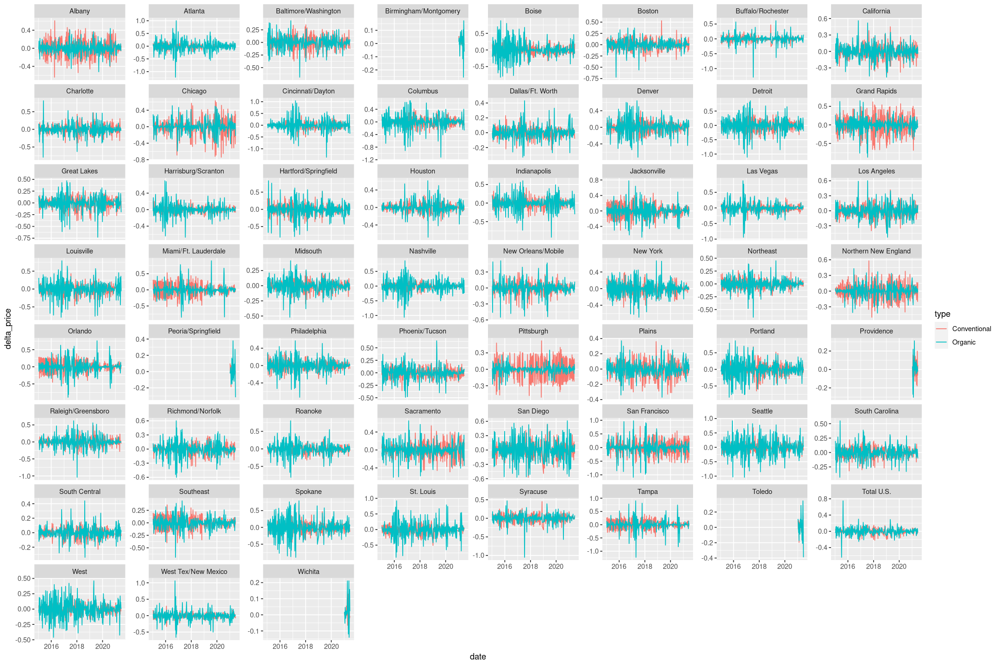

In [18]:
avos %>%
gf_line(delta_price ~ date, col=~type) %>%
gf_facet_wrap(~geo, scale="free_y")

Volume is noisy over time.

Notice that the organic volume becomes noisier as the baseline gets noisier.

Warning message:
“Removed 1 row(s) containing missing values (geom_path).”


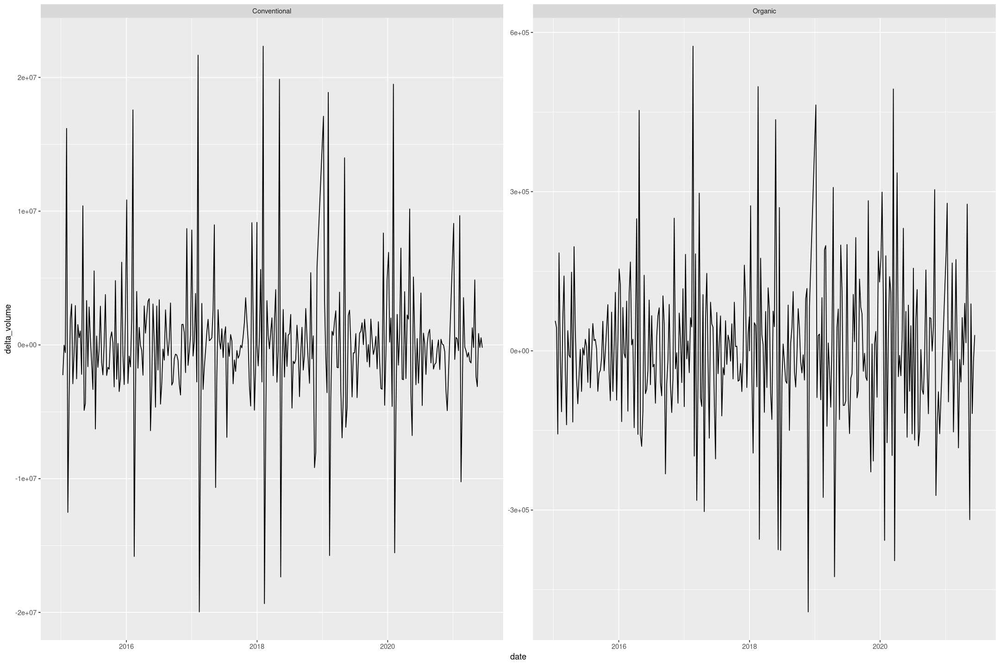

In [19]:
avos %>%
filter(geo == US) %>%
gf_line(delta_volume ~ date) %>%
gf_facet_wrap(~type, scale="free_y")

Estimated elasticities.

Weekly elasticity is sharply peaked

In [20]:
avos <- avos %>%
mutate(elas = if_else(delta_price > 0, delta_volume / volume * price / delta_price,as.double(NA)),
       delta = delta_volume / delta_price) 

In [21]:
avos %>% filter(geo==US) %>% group_by(type) %>% summarise(mean(elas, na.rm=T),
                                                          sd(elas, na.rm=T))

type,"mean(elas, na.rm = T)","sd(elas, na.rm = T)"
<fct>,<dbl>,<dbl>
Conventional,-1.473515,2.906546
Organic,-2.530682,5.688731


In [22]:
data.frame(x=seq(-10, 10, length.out=200)) %>% mutate(y=dnorm(x, -1.5))

x,y
<dbl>,<dbl>
-10.00000000,8.166236e-17
-9.89949749,1.909123e-16
-9.79899497,4.418340e-16
-9.69849246,1.012273e-15
-9.59798995,2.295882e-15
-9.49748744,5.154836e-15
-9.39698492,1.145759e-14
-9.29648241,2.521071e-14
-9.19597990,5.491489e-14


In [23]:
data.frame(x=seq(-10, 10, length.out=200)) %>% mutate(y=dnorm(x, -1.5, 2.95)) %>% summarise(max(y))

max(y)
<dbl>
0.1352205


In [24]:
40/.13

[1] 307.6923

A normal distribution looks too wide; maybe we want something more like a t-distribution?

Warning message:
“Removed 168 rows containing non-finite values (stat_bin).”


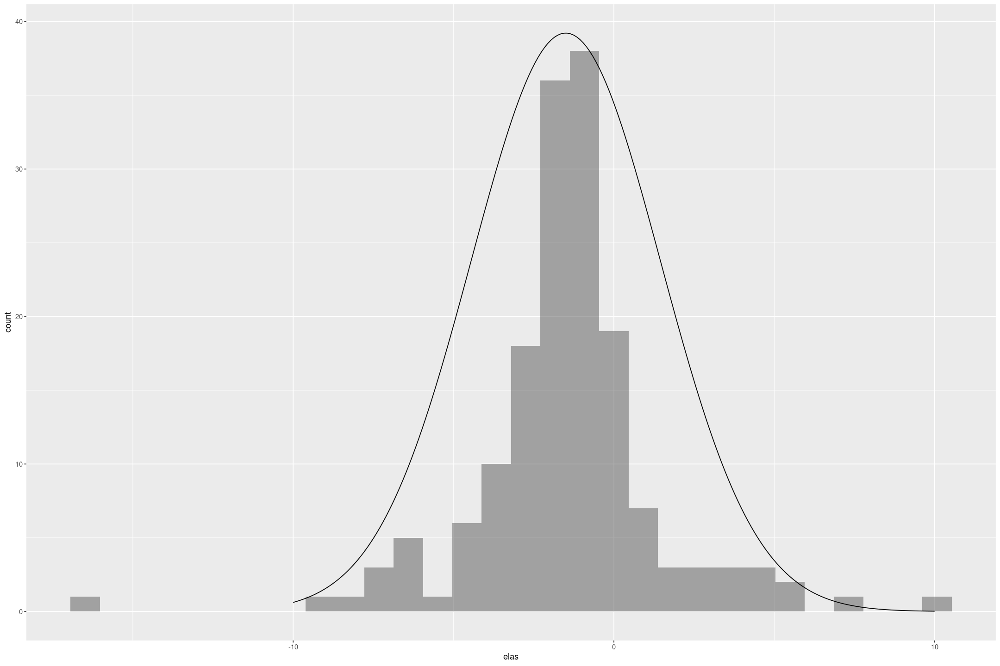

In [25]:
avos %>%
filter(geo == US, type=="Conventional") %>%
gf_histogram(~elas, bins=30) %>%
gf_line(290*y ~ x, data=data.frame(x=seq(-10, 10, length.out=200)) %>% mutate(y=dnorm(x, -1.5, 2.95)))

## Checking self-consistency

The volumes of bags almost always add up

In [26]:
sum(abs(avos$volume_bag - avos$volume_bag_small - avos$volume_bag_large - avos$volume_bag_xlarge) > 0.001)

[1] 6520

In [27]:
max(abs(avos$volume_bag - avos$volume_bag_small - avos$volume_bag_large - avos$volume_bag_xlarge))

[1] 657959.3

Something odd is happening where volume doesn't add up

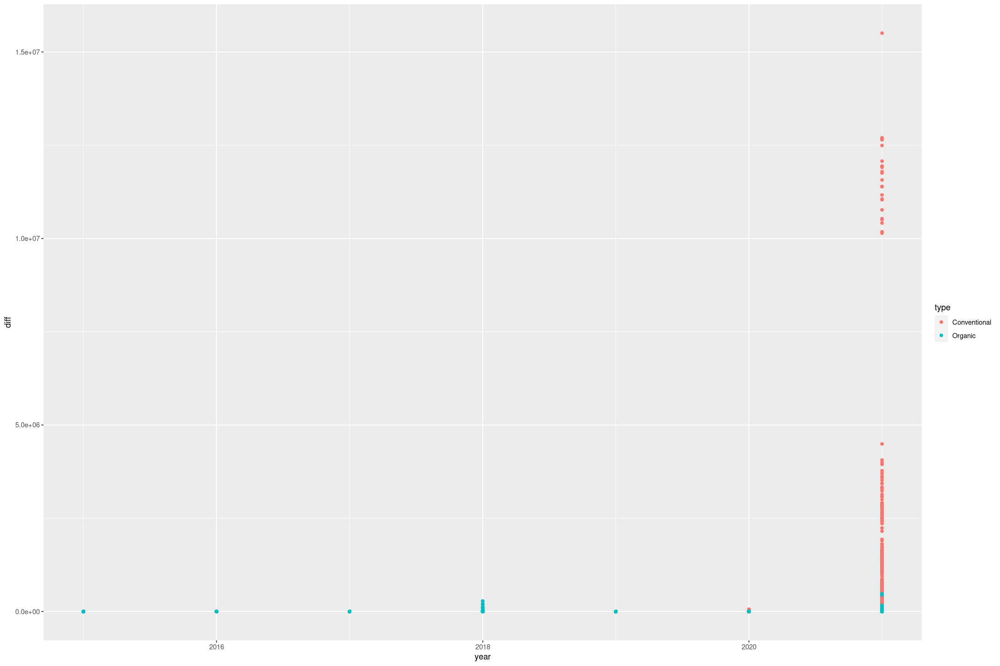

In [28]:
avos %>% 
mutate(diff=volume - volume_4046 - volume_4225 - volume_4770 - volume_bag) %>% 
gf_point(diff ~ year, col=~type)

Where the missing avocados are more than 10% of volume

In [29]:
avos %>% 
mutate(diff=volume - volume_4046 - volume_4225 - volume_4770 - volume_bag) %>% 
filter(diff/volume > 0.1)

geo,Timeframe,date,type,price,volume,volume_4046,volume_4225,volume_4770,volume_bag,volume_bag_small,volume_bag_large,volume_bag_xlarge,Bulk GTIN,year,region,granularity,delta_price,delta_volume,elas,delta,diff
<chr>,<chr>,<date>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Atlanta,Weekly,2021-01-04,Conventional,0.8163950,780570.69,308199.17,45153.36,80.81,171244.48,156431.07,10715.51,2159.45,255892.88,2021,Southeast,0,0.086395018,78764.91,0.95352523,9.116835e+05,255892.87
Birmingham/Montgomery,Weekly,2021-01-04,Conventional,0.7318575,348845.24,177970.28,12901.64,10.01,93996.81,80416.64,11883.90,1260.49,63966.51,2021,NA,NA,NA,NA,NA,NA,63966.50
Boise,Weekly,2021-01-04,Conventional,0.8742976,152240.40,39164.12,15398.73,1232.75,29772.49,24111.88,16.93,281.67,66672.30,2021,West,0,-0.105702418,49065.25,NA,-4.641829e+05,66672.31
Boston,Weekly,2021-01-04,Conventional,1.2732016,623044.67,14642.26,372121.22,181.13,154109.93,132234.48,20888.00,0.00,81990.13,2021,Northeast,0,0.003201647,11886.01,7.58648583,3.712467e+06,81990.13
Chicago,Weekly,2021-01-04,Conventional,1.0988230,925862.64,104614.48,174551.01,38351.80,250084.67,237724.87,3883.29,7812.00,358260.68,2021,Great Lakes,0,0.208823045,-87879.77,-0.49944962,-4.208337e+05,358260.68
Cincinnati/Dayton,Weekly,2021-01-04,Conventional,0.7933082,349949.49,54812.11,67640.42,4372.69,29919.11,24101.24,754.29,3676.12,193205.15,2021,Great Lakes,0,-0.156691846,128140.37,NA,-8.177858e+05,193205.16
Columbus,Weekly,2021-01-04,Conventional,0.7952607,297508.88,50051.11,55321.61,558.70,37631.57,32200.60,253.58,4351.84,153945.89,2021,Great Lakes,0,-0.014739270,115464.82,NA,-7.833822e+06,153945.89
Dallas/Ft. Worth,Weekly,2021-01-04,Conventional,0.6472227,1613422.02,506303.66,270772.43,24499.53,434926.55,389292.79,1392.30,42593.67,376919.85,2021,South Central,0,0.057222675,138656.04,0.97202264,2.423096e+06,376919.85
Denver,Weekly,2021-01-04,Conventional,0.8503250,1168996.22,203293.93,140360.77,2664.79,235530.22,186149.48,17776.57,12807.42,587146.51,2021,West,0,-0.089674994,408970.38,NA,-4.560584e+06,587146.51


An example: Detroit Avocados

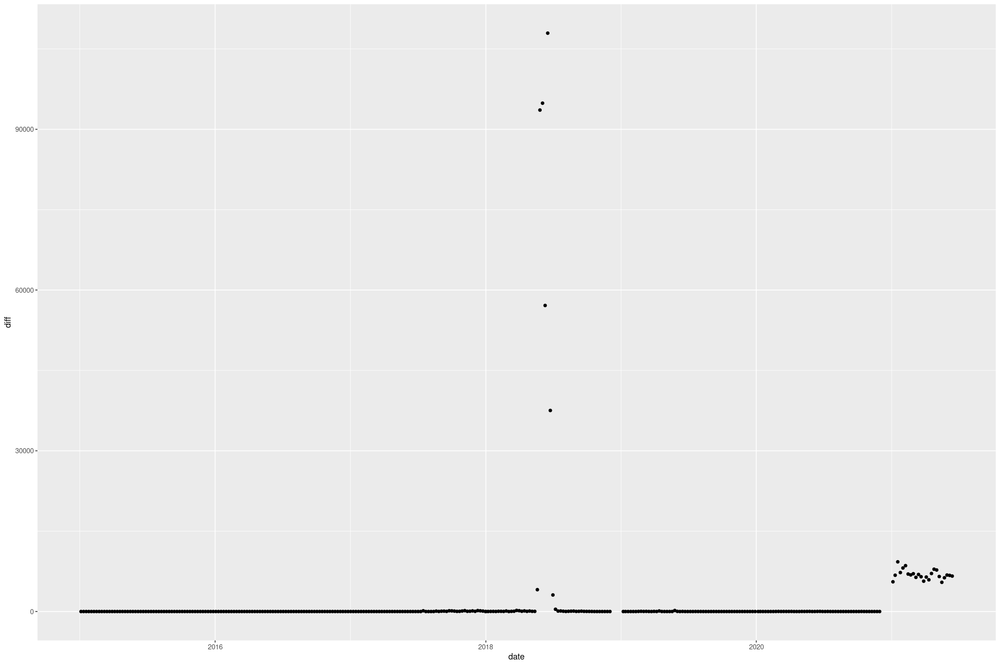

In [30]:
avos %>%
filter(geo == 'Detroit', type == 'Organic')  %>% 
mutate(diff=volume - volume_4046 - volume_4225 - volume_4770 - volume_bag) %>% gf_point(diff ~ date)

The volume looks anomolously high here!

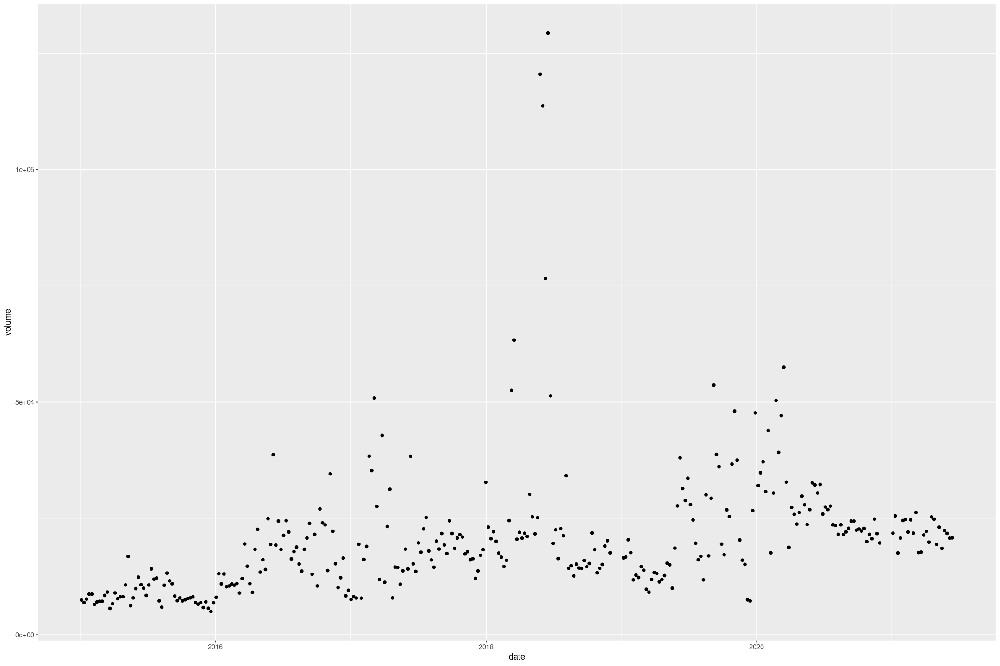

In [31]:
avos %>%
filter(geo == 'Detroit', type == 'Organic')  %>% 
gf_point(volume ~ date)

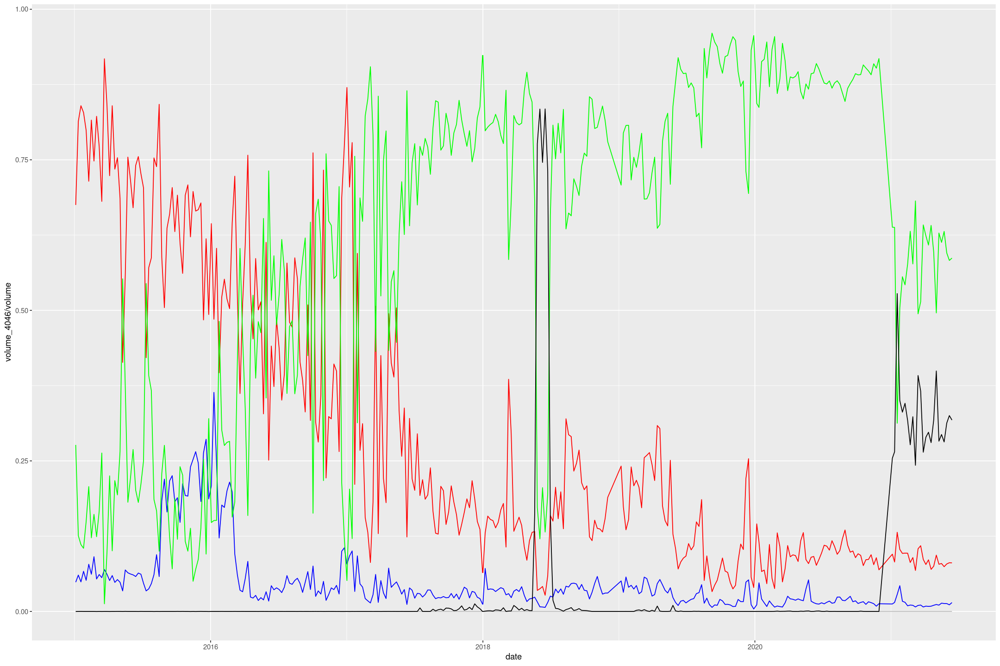

In [32]:
avos %>% filter(geo == 'Detroit', type == 'Organic')  %>% 
mutate(diff=volume - volume_4046 - volume_4225 - volume_4770 - volume_bag) %>%
gf_line(volume_4046/volume ~ date, col="blue") %>%
gf_line(volume_4225/volume ~ date, col="red") %>%
gf_line(volume_4770/volume ~ date, col="grey") %>%
gf_line(volume_bag/volume ~ date, col="green") %>%
gf_line(diff/volume ~ date, col="black")

## Validity

One validity issue is in the assumption that volume sold is volume available; where that's false the data breaks down.
Stores may overcharge and have produce go to waste, which would result in this data being invalid.

Another is the assumption that average sale price is representative.
In some stores the price will be higher, in others lower.
If the spread over time is fairly stable it won't effect the analysis, but a shift to discount stores (such as Costco) could impact the price-volume relationship.

I am assuming the scanner data is representative (or made to be representative) of the population of stores.

We could in principle collect samples of this kind of data; going to stores and noting the price and stock levels (and in particular when it is out of stock).

## Reliability

This data is likely reliable.
If it's been taken from stores registers that's likely going to capture almost all transactions in the store accurately.

# Distributions

For convenience: Total us converntional avocados

In [33]:
uscavos <- avos %>% filter(geo==US, type=="Conventional")

## Price

Fitting a normal distribution:

In [34]:
mu <- mean(uscavos$price)
sigma <- sd(uscavos$price)

x <- seq(min(uscavos$price), max(uscavos$price), by=0.01)
y <- dnorm(x, mu, sigma)

price_norm <- data.frame(x=x, y=y)

A normal distribution isn't a great fit to the price data

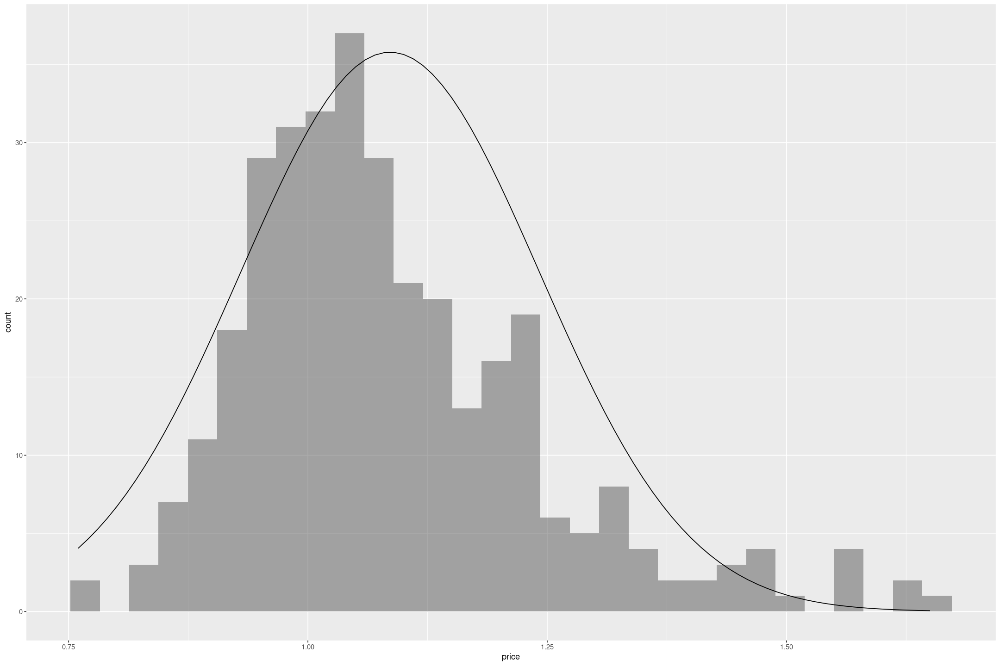

In [35]:
uscavos %>% 
gf_histogram(~price, bins=30) %>%
gf_line(14*y~x,  data=price_norm)

In [36]:
mu <- mean(log(uscavos$price))
sigma <- sd(log(uscavos$price))

y <- 1/(x*sigma*sqrt(2*pi)) * exp(-0.5*(log(x) - mu)^2/sigma^2) 
price_lognorm <- data.frame(x=x, y=y)

A log normal distribution is better, but too thick; it looks like the data has a longer tail.

In [37]:
scale_factor <- 50/max(y)

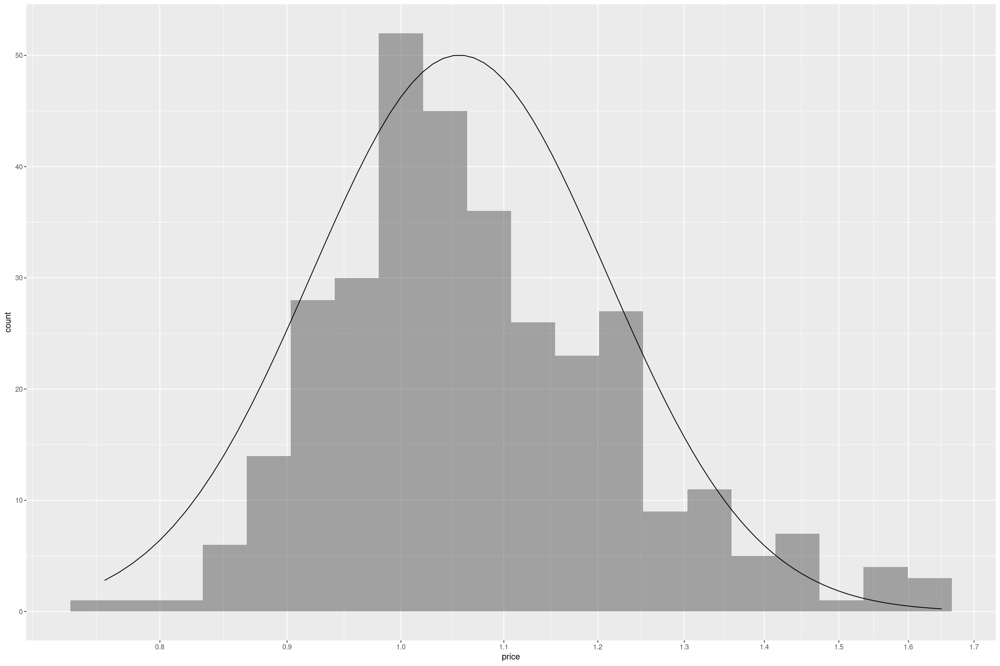

In [38]:
uscavos %>%
gf_histogram(~price, bins=20) %>%
gf_line(scale_factor*y~x,  data=price_lognorm) +
scale_x_log10(breaks=seq(0.6, 2, by=0.1))

## Volume

In [39]:
mu <- mean(log(uscavos$volume))
sigma <- sd(log(uscavos$volume))

x <- seq(min(uscavos$volume), max(uscavos$volume), length.out=1000)

y <- 1/(x*sigma*sqrt(2*pi)) * exp(-0.5*(log(x) - mu)^2/sigma^2) 
volume_lognorm <- data.frame(x=x, y=y)

In [40]:
scale_factor <- 40/max(y)

For volume a lognormal distribution is an ok fit as well.

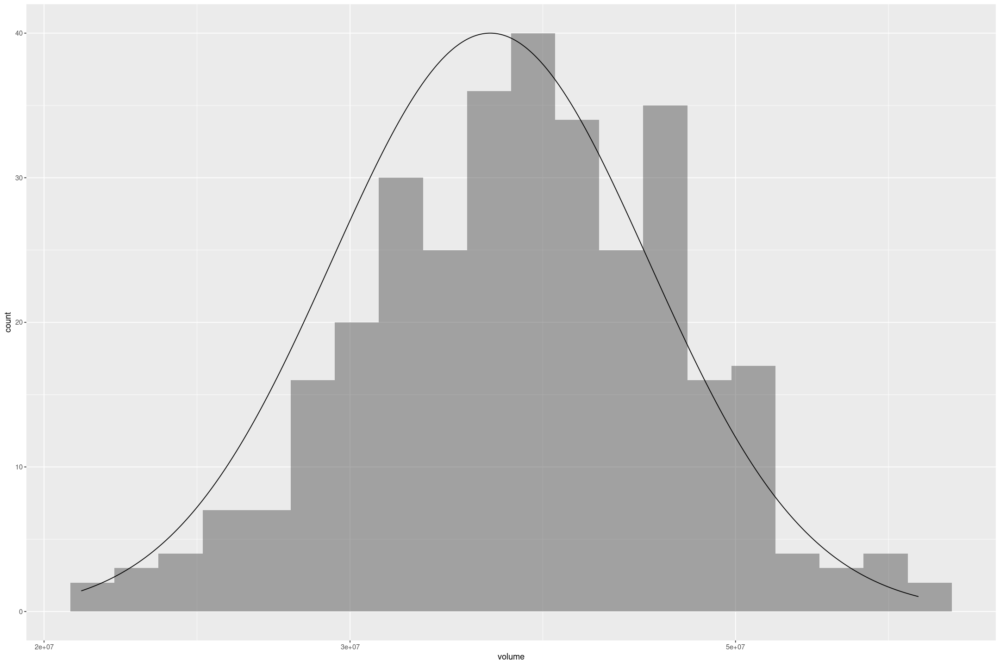

In [41]:
uscavos %>% 
gf_histogram(~volume, bins=20) %>%
gf_line(scale_factor * y ~ x, data=volume_lognorm) + 
scale_x_log10()

# Comparisons


# Simulation

# Regression to the Mean

Let's examine regression to the mean in terms of volume changes week on week

In [42]:
uscavos <- 
uscavos %>%
mutate(last_volume = lag(volume, order_by=date))

Warning message:
“Removed 1 rows containing missing values (geom_point).”


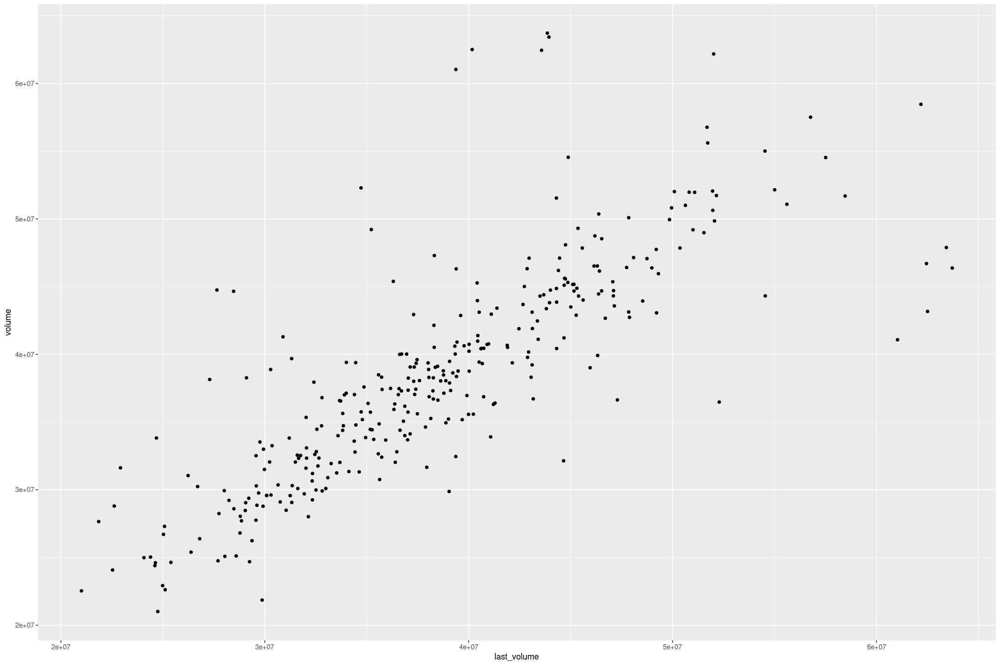

In [43]:
uscavos %>%
gf_point(volume ~ last_volume)

We can fit a linear model

In [44]:
fit <- stan_glm(volume ~ last_volume, data=uscavos)

In [45]:
print(fit, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      volume ~ last_volume
 observations: 329
 predictors:   2
------
            Median     MAD_SD    
(Intercept) 7747042.41 1290206.90
last_volume       0.80       0.03

Auxiliary parameter(s):
      Median     MAD_SD    
sigma 4843219.42  193406.92

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


So the estimates slope is 0.8; there's some regression to the mean.

In [46]:
sigma(fit) / sd(uscavos$volume)

[1] 0.5997987

# Fitting a line

In [47]:
pe_fit <- stan_glm(log(volume) ~ log(price), data=uscavos)

In [48]:
mean(uscavos$price)

[1] 1.085862

In [49]:
exp(17.5 - 0.7 * log(1.08))

[1] 37736082

In [50]:
exp(-0.7*log(1.1))

[1] 0.9354598

Ignore the volume at price 0; that doesn't make sense.

This says at \$1.09 the volume is exp(17.5 - 0.7 * log(1.08)); around 37 Million Avocados.

The coefficient says that in two weeks with a 10\% difference in price the volume on average differs by 7\% (and is lower in the week where the price is higher).
This says that the elasticity is -0.7; and so it would be considered inelastic, but we're not accounting for change over time.

In [51]:
print(pe_fit)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 330
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.5    0.0  
log(price)  -0.6    0.1  

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.2    0.0   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Predicting the estimates

In [52]:
price_grid <- seq(min(uscavos$price), max(uscavos$price), length.out=1000)

df_preds <- 
data.frame(price=price_grid) %>%
mutate(volume=exp(predict(pe_fit, newdata=.)))

In [53]:
n_sample = 20
df_pred_sample <- data.frame()
for (i in 1:n_sample) {
    cs = as.matrix(pe_fit)[i,]
    vol_pred <- exp(cs[["(Intercept)"]] + cs[["log(price)"]] * log(price_grid))
    df_pred_sample <- rbind(df_pred_sample, data.frame(price=price_grid, volume=vol_pred, sample=i))
}

It sort of fits through the points, but there's still a *lot* of variation.

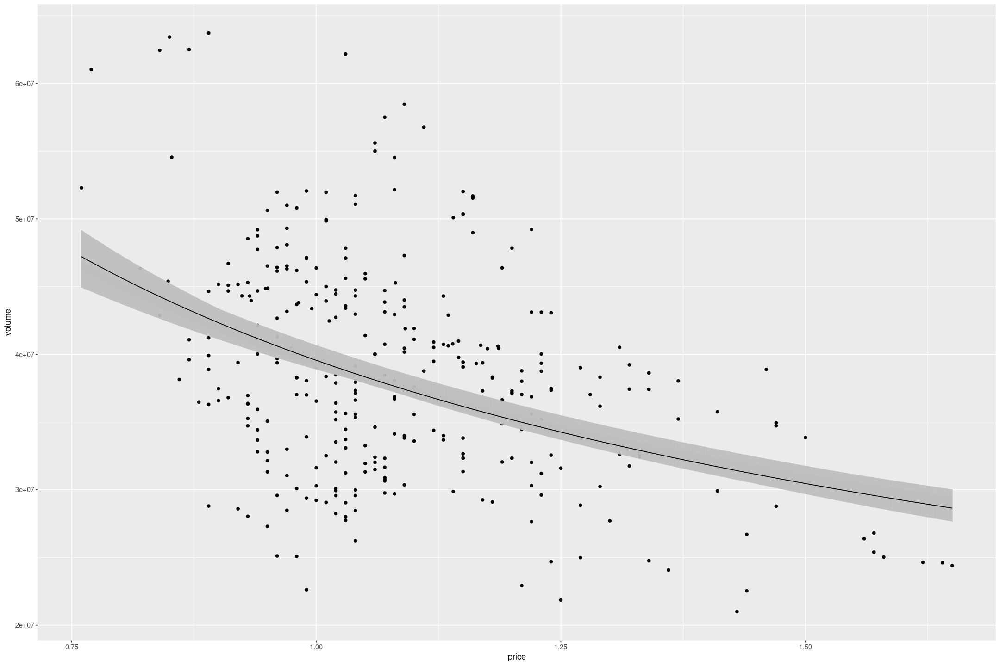

In [54]:
uscavos %>%
gf_point(volume ~ price) %>%
gf_line(data=df_pred_sample, col="grey") %>%
gf_line(data=df_preds, col="black")

# Influence

Take your fitted regression line and compute the influence of each data point on the estimated slope.
Where could you add a new data point so it would have zero influence on the estimated slope?
Where could you add a point so it would have a large influence?

To be honest I'm not convinced of the usefulness of the concept of *influence*, what I'm more interested is in how removing a point would impact the slope (leave-one-out), because outliers can occur in different ways.

But nevertheless...

In [103]:
print(pe_fit, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 330
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.49   0.01 
log(price)  -0.65   0.08 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.19   0.01  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


The influence is just how far a point is from the mean value

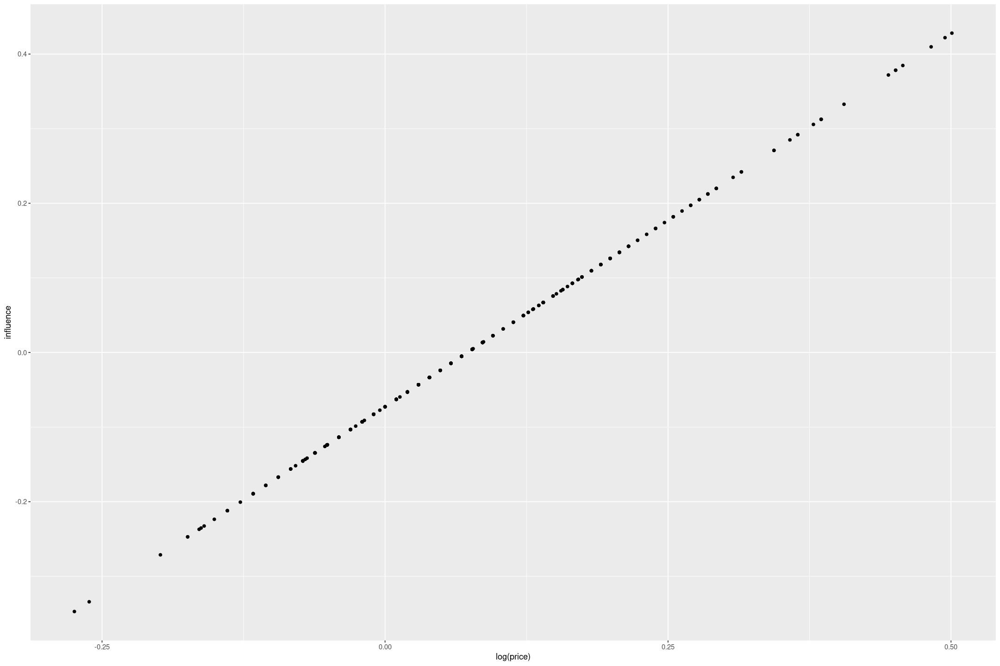

In [90]:
uscavos %>% 
mutate(influence = log(price) - mean(log(price))) %>%
gf_point(influence ~ log(price))

If we add a point at the mean value it should have no effect on the slope.
Doing this in log scale gives us the geometric mean.

In [116]:
geomean_price <- exp(mean(log(uscavos$price)))
c(geomean_price, predict(pe_fit, newdata=data.frame(price=geomean_price)))

1 
 1.07548 17.44664

The slope is pretty much unaffected adding a point, even a *long* way off the regression line.

In [120]:
newmodel <- stan_glm(log(volume) ~ log(price),
         data = uscavos %>% bind_rows(data.frame(volume=c(exp(0)), price=c(geomean_price))),
        refresh=0)
print(newmodel, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 331
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.44   0.06 
log(price)  -0.65   0.39 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.98   0.04  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Whereas if we add a point a long way away a little off the regression line...

In [112]:
max_price = max(uscavos$price)
predict(pe_fit, newdata=data.frame(price=max_price))

1 
17.16919

Putting a point just a little bit above or below the regression line at this distant point changes the slope a lot.

In [121]:
newmodel <- stan_glm(log(volume) ~ log(price),
         data = uscavos %>% bind_rows(data.frame(volume=c(exp(18.2)), price=c(max_price))),
        refresh=0)
print(newmodel, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 331
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.49   0.01 
log(price)  -0.58   0.08 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.20   0.01  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


In [122]:
newmodel <- stan_glm(log(volume) ~ log(price),
         data = uscavos %>% bind_rows(data.frame(volume=c(exp(16.2)), price=c(max_price))),
        refresh=0)
print(newmodel, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 331
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.50   0.01 
log(price)  -0.71   0.08 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.20   0.01  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


# Informative Prior

https://escholarship.org/uc/item/3432z1pv
    California            Avocados                                                            -0.86 
    Food            (in            general)                                                            -0.42 
    
    

I'd be surprised if a 10% change in price made less than a 1% drop in volume, or more than a 30% drop.
So elasticity likley be between -0.1 and -3

`(Price - Cost)* Volume`

In [55]:
pe_fit <- stan_glm(log(volume) ~ log(price), data=uscavos, prior=normal(-1.5, 1.5))

Essentially unchanges

In [56]:
print(pe_fit)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 330
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.5    0.0  
log(price)  -0.6    0.1  

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.2    0.0   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


# Muiltiple regression and Interactions

In [57]:
fit_base <- stan_glm(log(volume) ~ log(price) + year + month,
         data=uscavos %>% mutate(year=as.factor(year), month=as.factor(month(date))))
print(fit_base, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price) + year + month
 observations: 330
 predictors:   19
------
            Median MAD_SD
(Intercept) 17.23   0.02 
log(price)  -0.86   0.04 
year2016     0.10   0.01 
year2017     0.23   0.02 
year2018     0.31   0.01 
year2019     0.37   0.01 
year2020     0.45   0.01 
year2021     0.30   0.02 
month2       0.04   0.02 
month3       0.05   0.02 
month4       0.10   0.02 
month5       0.17   0.02 
month6       0.15   0.02 
month7       0.13   0.02 
month8       0.08   0.02 
month9       0.03   0.02 
month10     -0.04   0.02 
month11     -0.15   0.02 
month12     -0.14   0.02 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.07   0.00  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


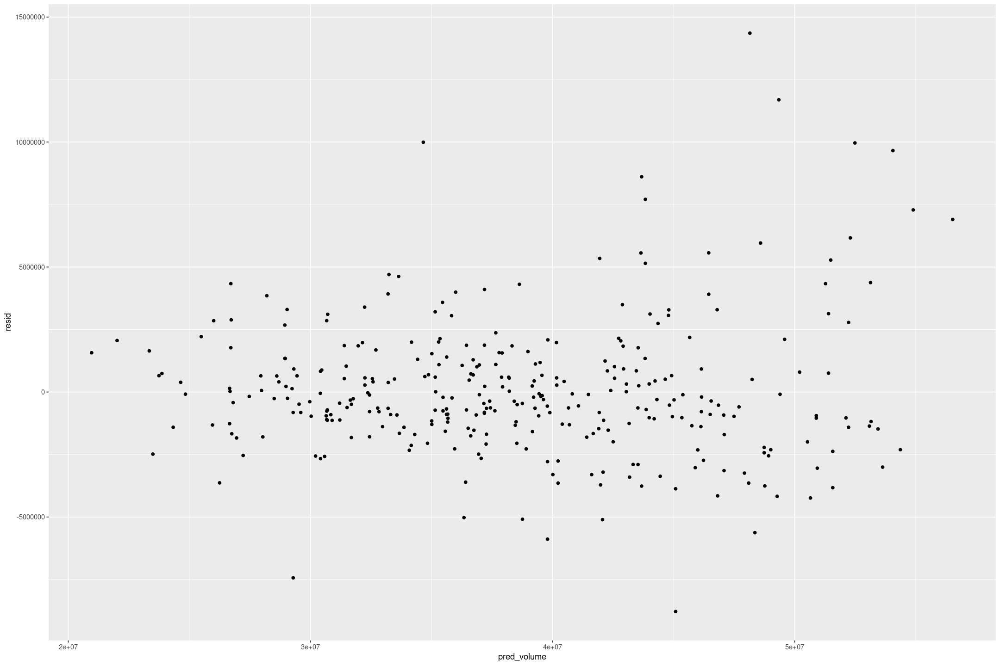

In [58]:
uscavos %>%
modelr::add_predictions(fit_base) %>%
mutate(pred_volume = exp(pred),
       resid = volume - pred_volume) %>%
gf_point(resid ~ pred_volume)

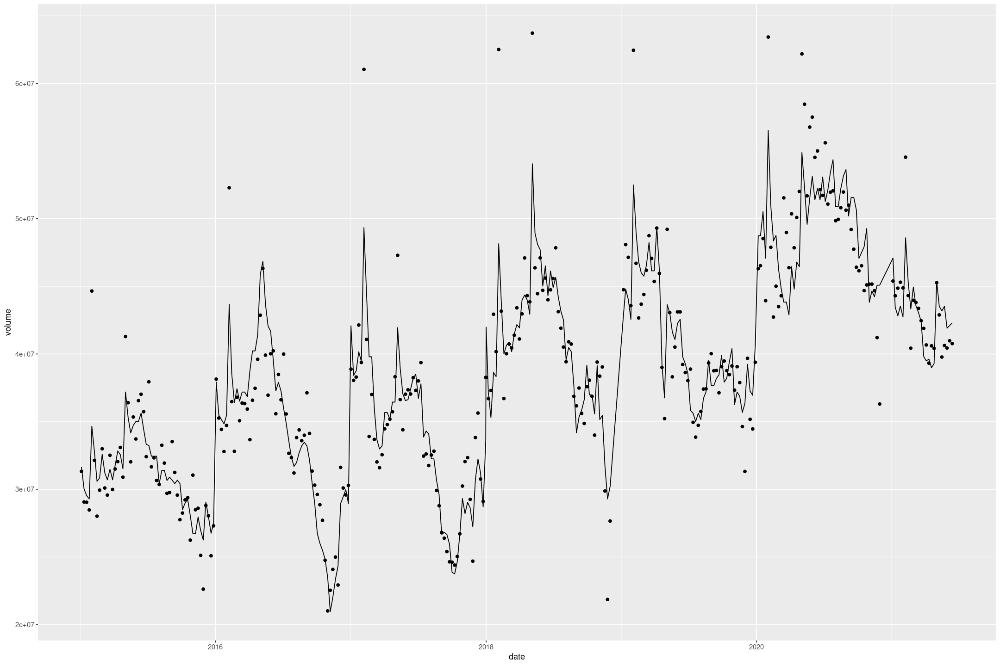

In [59]:
uscavos %>%
modelr::add_predictions(fit_base) %>%
mutate(pred_volume = exp(pred)) %>%
gf_point(volume ~ date) %>%
gf_line(pred_volume ~ date)

In [60]:
stan_glm(log(volume) ~ log(price),
         data=uscavos %>% mutate(year=as.factor(year), month=as.factor(month(date))))

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 330
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.5    0.0  
log(price)  -0.6    0.1  

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.2    0.0   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

Monthly effects make a difference

In [61]:
stan_glm(log(volume) ~ log(price) : year + year + month,
         data=uscavos %>% mutate(year=as.factor(year), month=as.factor(month(date))))

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price):year + year + month
 observations: 330
 predictors:   25
------
                    Median MAD_SD
(Intercept)         17.2    0.0  
year2016             0.1    0.0  
year2017             0.2    0.0  
year2018             0.3    0.0  
year2019             0.4    0.0  
year2020             0.4    0.0  
year2021             0.3    0.0  
month2               0.0    0.0  
month3               0.0    0.0  
month4               0.1    0.0  
month5               0.2    0.0  
month6               0.1    0.0  
month7               0.1    0.0  
month8               0.1    0.0  
month9               0.1    0.0  
month10              0.0    0.0  
month11             -0.1    0.0  
month12             -0.1    0.0  
log(price):year2015 -1.4    0.2  
log(price):year2016 -0.8    0.1  
log(price):year2017 -1.0    0.1  
log(price):year2018 -1.4    0.1  
log(price):year2019 -0.9    0.1  
log(price):year2020 -0.3    0.1  
lo

In [62]:
stan_glm(log(volume) ~ log(price) * geo * type + geo + type, data=avos %>% filter(granularity==1))

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price) * geo * type + geo + type
 observations: 5280
 predictors:   32
------
                                        Median MAD_SD
(Intercept)                             15.7    0.0  
log(price)                              -0.5    0.1  
geoGreat Lakes                          -0.5    0.0  
geoMidsouth                             -0.5    0.0  
geoNortheast                            -0.1    0.0  
geoPlains                               -1.1    0.0  
geoSouth Central                        -0.1    0.0  
geoSoutheast                            -0.3    0.0  
geoWest                                  0.0    0.0  
typeOrganic                             -3.4    0.1  
log(price):geoGreat Lakes               -0.3    0.1  
log(price):geoMidsouth                  -0.4    0.2  
log(price):geoNortheast                 -0.5    0.2  
log(price):geoPlains                    -0.3    0.2  
log(price):geoSouth Central        

In [63]:
fit = stan_glm(log(volume) ~ log(price) * year + year, data=uscavos %>% mutate(year=as.factor(year)))
print(fit, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price) * year + year
 observations: 330
 predictors:   14
------
                    Median MAD_SD
(Intercept)         17.25   0.02 
log(price)          -0.08   0.31 
year2016             0.11   0.02 
year2017             0.23   0.03 
year2018             0.39   0.03 
year2019             0.32   0.02 
year2020             0.45   0.02 
year2021             0.34   0.03 
log(price):year2016 -0.90   0.32 
log(price):year2017 -0.77   0.32 
log(price):year2018 -1.52   0.36 
log(price):year2019 -0.38   0.33 
log(price):year2020  0.43   0.35 
log(price):year2021 -0.42   0.37 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.10   0.00  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


In [64]:
df_predict <- expand.grid(price=price_grid, year=as.factor(seq(2015, 2021))) %>%
mutate(volume = exp(predict(fit, newdata=.)))

The slopes are all over the place

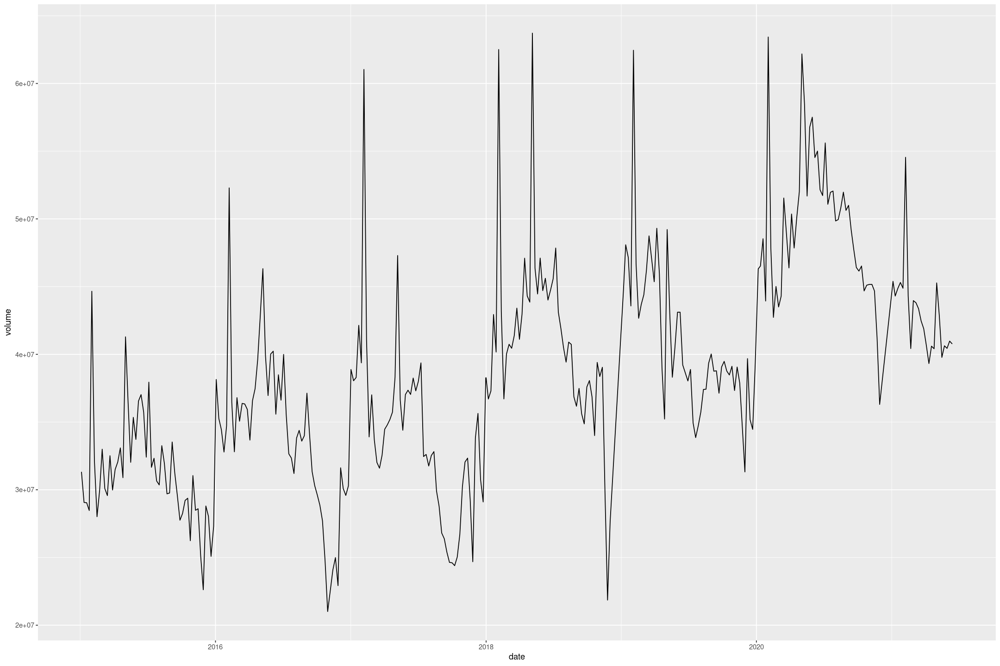

In [65]:
uscavos %>% gf_line(volume ~ date)

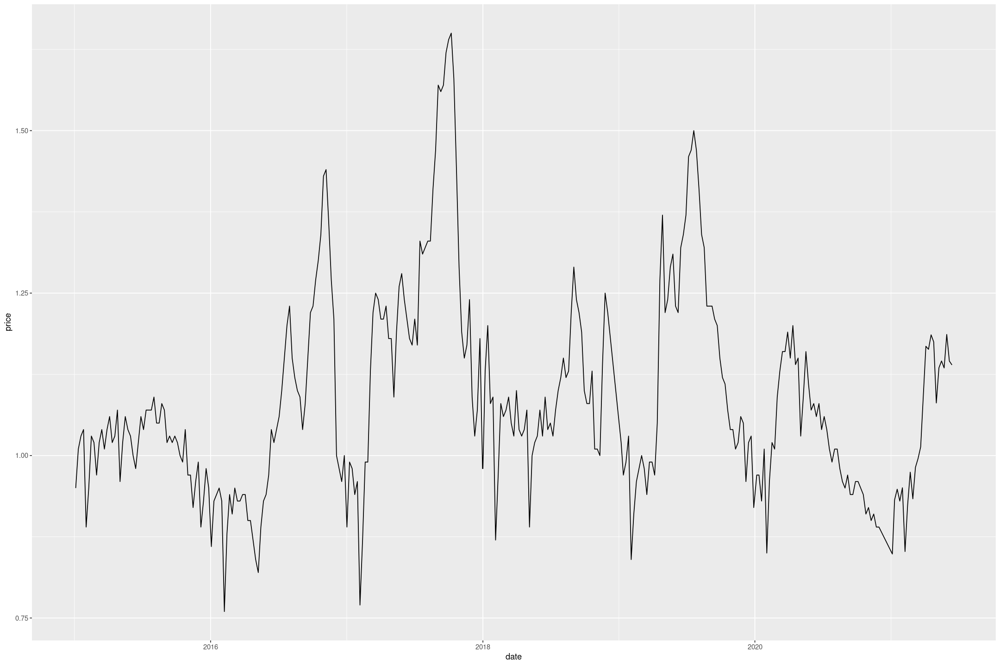

In [66]:
uscavos %>% gf_line(price ~ date)

The data looks a bit crazy - the lines for each year have a very different slope, and in 2020 it's positive.

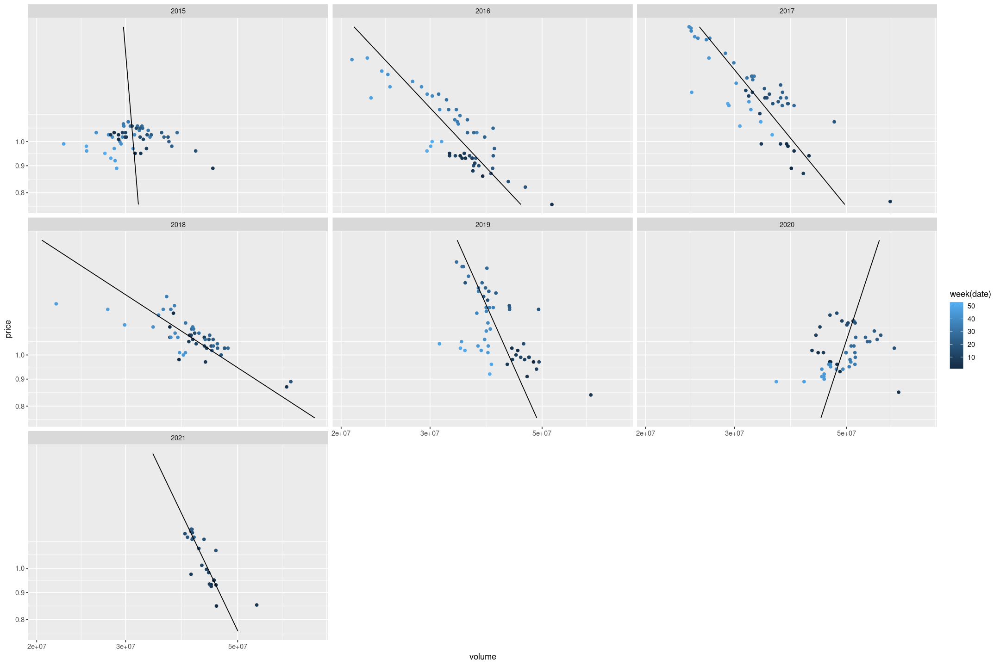

In [67]:
uscavos %>% 
gf_point(price ~ volume | year, col=~week(date)) %>%
gf_line(price ~ volume | year, df_predict, col="black") +
scale_x_log10() +
scale_y_log10()

## Using deltas

Warning message:
“Removed 1 rows containing missing values (geom_point).”


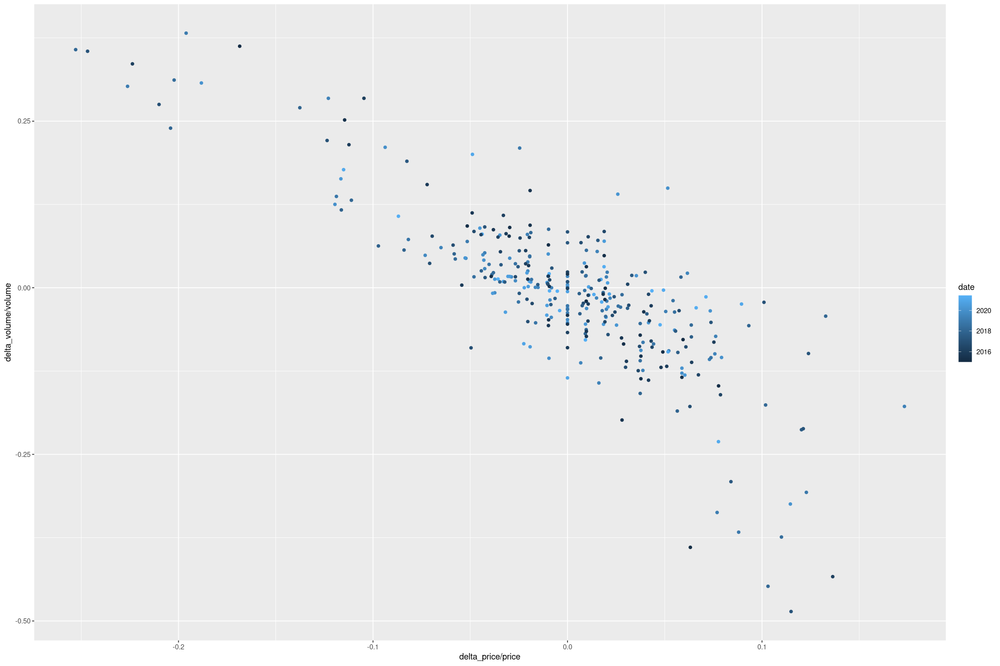

In [68]:
uscavos %>% gf_point(delta_volume/volume ~ delta_price/price, col=~date)

In [69]:
uscavos <- uscavos %>% 
mutate(last_volume = lag(volume, order_by=date),
       last_price = lag(price, order_by=date),
       pct_volume = delta_volume/last_volume,
       pct_price=delta_price/last_price)

In [70]:
pct_fit = stan_glm(pct_volume ~ pct_price, data=uscavos %>% mutate(month=as.factor(month(date)), year=as.factor(year)), refresh=0)
print(pct_fit, digits=3)

stan_glm
 family:       gaussian [identity]
 formula:      pct_volume ~ pct_price
 observations: 329
 predictors:   2
------
            Median MAD_SD
(Intercept)  0.013  0.004
pct_price   -1.826  0.069

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.073  0.003 

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


In [71]:
data <- uscavos %>% mutate(month=as.factor(month(date)), year=as.factor(year)) %>% arrange(date)

In [72]:
preds <- c(0, predict(pct_fit, newdata=data[-1,]))

In [73]:
vol0 <- data$volume[1]

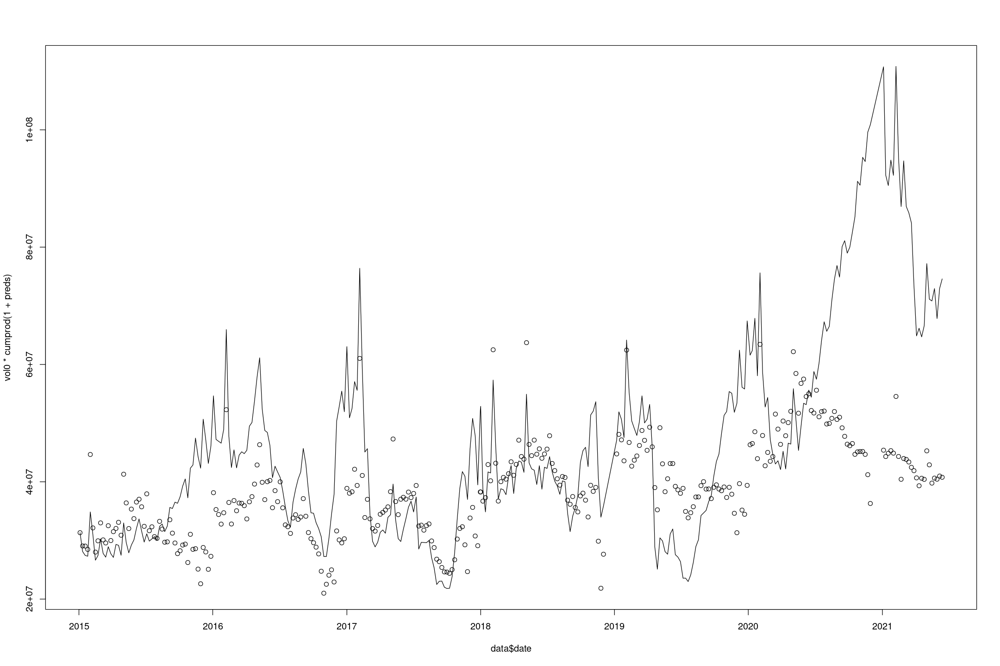

In [74]:
plot(data$date, vol0 * cumprod(1 + preds), type='l')
points(data$date, data$volume)

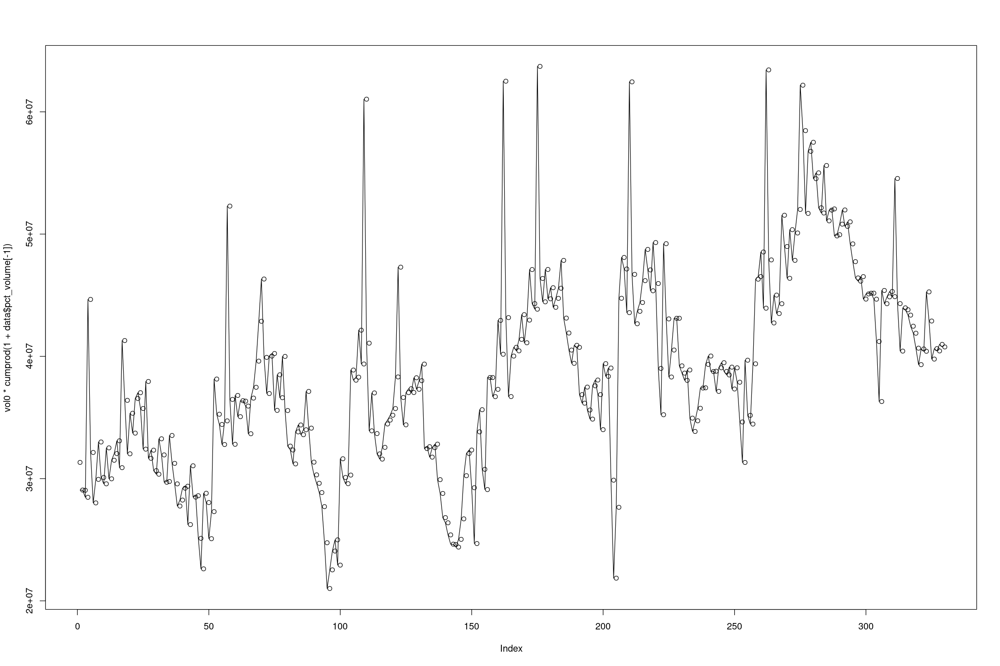

In [75]:
plot(vol0 * cumprod(1 + data$pct_volume[-1]), type='l')
points(data$volume)

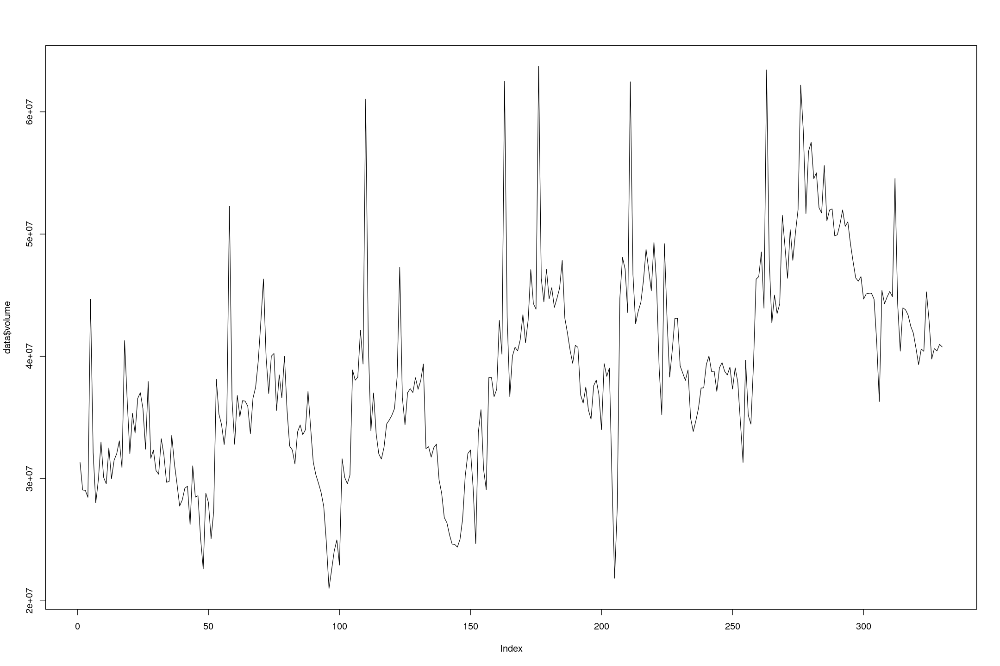

In [76]:
plot(data$volume, type='l')

Warning message:
“geom_abline(): Ignoring `mapping` because `slope` and/or `intercept` were provided.”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


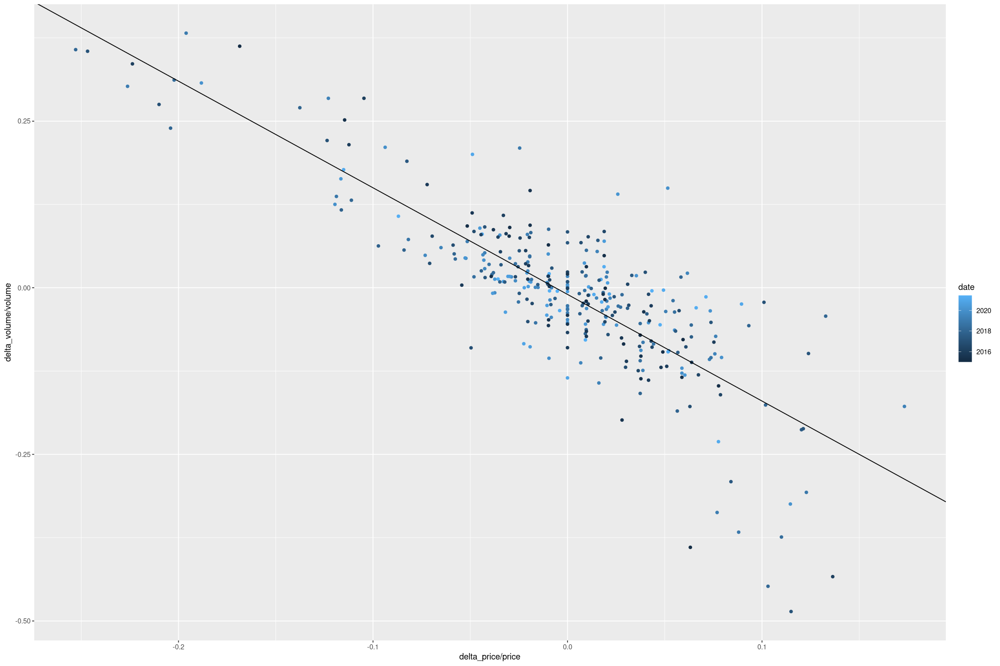

In [77]:
uscavos %>% gf_point(delta_volume/volume ~ delta_price/price, col=~date) %>% gf_abline(slope=-1.6, intercept=-0.01)

In [78]:
uscavos %>% summarise(sum(pct_price, na.rm=T), sum(pct_volume, na.rm=T))

"sum(pct_price, na.rm = T)","sum(pct_volume, na.rm = T)"
<dbl>,<dbl>
0.7746198,2.788076


Warning message:
“Removed 1 row(s) containing missing values (geom_path).”


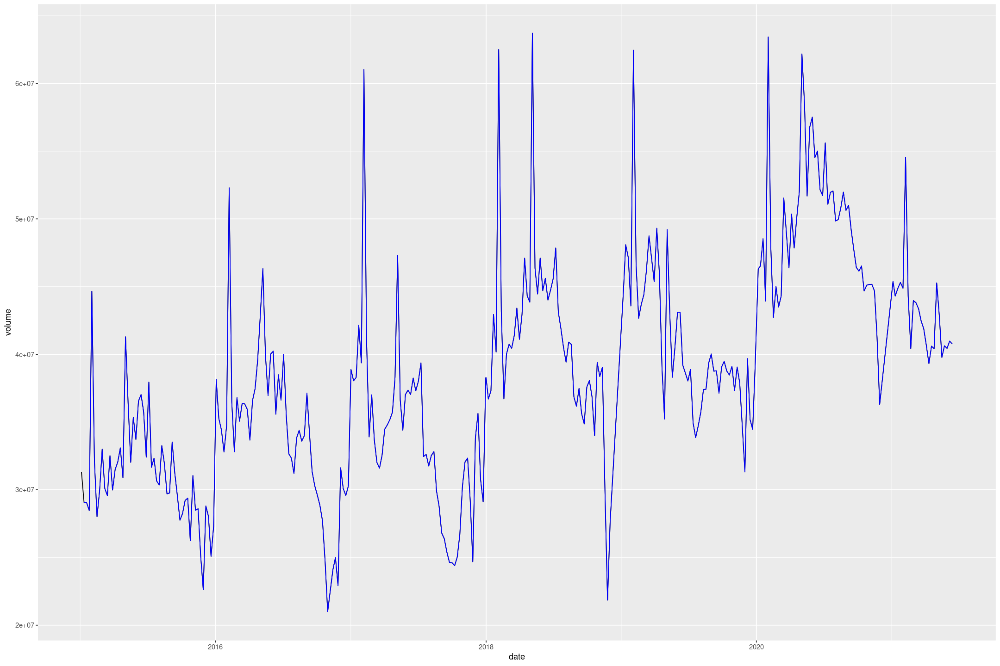

In [79]:
uscavos %>% 
mutate(est_volume = lag(volume, order_by=date) + delta_volume) %>%
gf_line(volume ~ date) %>% 
gf_line(est_volume ~ date, col="blue")

In [80]:
sum(uscavos$delta_volume, na.rm=T)

[1] 9444956

In [81]:
uscavos[[1,"volume"]] - uscavos[[nrow(uscavos), "volume"]]

[1] 5869990

In [82]:
nrow(uscavos)

[1] 330

In [84]:
-0.01 + -0.667*-1.6 / 310

[1] -0.006557419

In [85]:
fit = stan_glm(pct_volume ~ pct_price : year + year, data=uscavos %>% mutate(year=as.factor(year)), refresh=0)
print(fit, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      pct_volume ~ pct_price:year + year
 observations: 329
 predictors:   14
------
                   Median MAD_SD
(Intercept)         0.01   0.01 
year2016            0.01   0.01 
year2017            0.01   0.01 
year2018            0.01   0.01 
year2019            0.00   0.01 
year2020            0.00   0.01 
year2021            0.02   0.02 
pct_price:year2015 -2.66   0.22 
pct_price:year2016 -1.96   0.17 
pct_price:year2017 -1.69   0.14 
pct_price:year2018 -1.83   0.15 
pct_price:year2019 -1.84   0.16 
pct_price:year2020 -1.44   0.22 
pct_price:year2021 -1.34   0.28 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.07   0.00  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Warning message:
“geom_abline(): Ignoring `mapping` because `slope` and/or `intercept` were provided.”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


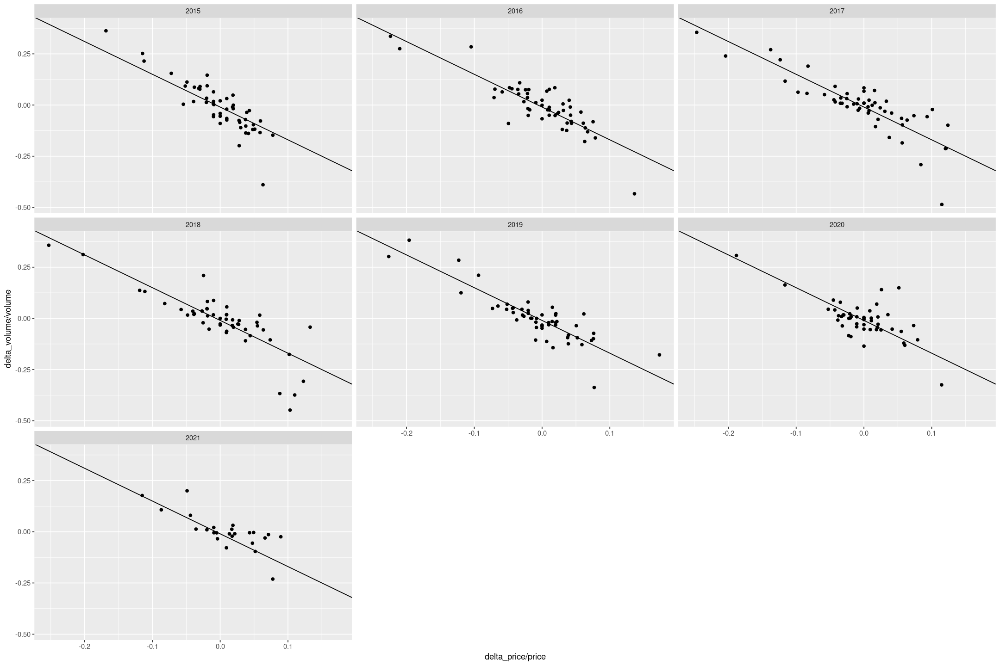

In [86]:
uscavos %>% 
gf_point(delta_volume/volume ~ delta_price/price | year) %>% gf_abline(slope=-1.6, intercept=-0.01)

## References for elasticities

https://hassavocadoboard.com/wp-content/uploads/2019/04/Hass-Avocado-Board-Price-Elasticities-of-Demand-or-Fresh-Hass-Avocados-2019.pdf


https://s.giannini.ucop.edu/uploads/giannini_public/5d/b8/5db8760f-ffe4-4e3c-8bce-3fd008ad0f9f/winter99.pdf

# Checking Model Fit and Assumptions

Graph and check the fit of the model and discuss the assumptions needed to use it ot make real-world inferences.

## Model Comparison

Let's have a look at a few of the models

In [140]:
uscavos <- uscavos %>%
mutate(year=as.factor(year), month=as.factor(month(date)),
       years_from_start=year(date) - min(year(date)))

Constant model

In [148]:
fit_constant <- stan_glm(log(volume) ~ 1, data=uscavos)
loo_constant <- loo(fit_constant)
print(fit_constant, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ 1
 observations: 330
 predictors:   1
------
            Median MAD_SD
(Intercept) 17.45   0.01 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.21   0.01  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Constant model

In [149]:
fit_price <- stan_glm(log(volume) ~ log(price), data=uscavos)
loo_price <- loo(fit_price)
print(fit_price, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price)
 observations: 330
 predictors:   2
------
            Median MAD_SD
(Intercept) 17.49   0.01 
log(price)  -0.65   0.08 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.19   0.01  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Seasonality - per month corrections

Note that e.g. Nov/Dec is low.

In [150]:
fit_month <- stan_glm(log(volume) ~ log(price) + month, data=uscavos)
loo_month <- loo(fit_month)
print(fit_month, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price) + month
 observations: 330
 predictors:   13
------
            Median MAD_SD
(Intercept) 17.48   0.03 
log(price)  -0.70   0.08 
month2       0.05   0.04 
month3       0.04   0.04 
month4       0.08   0.04 
month5       0.16   0.04 
month6       0.13   0.04 
month7       0.09   0.04 
month8       0.05   0.04 
month9       0.00   0.05 
month10     -0.08   0.05 
month11     -0.17   0.04 
month12     -0.20   0.05 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.16   0.01  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Per year corrections

In [151]:
fit_year <- stan_glm(log(volume) ~ log(price) + year, data=uscavos)
loo_year <- loo(fit_year)
print(fit_year, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price) + year
 observations: 330
 predictors:   8
------
            Median MAD_SD
(Intercept) 17.26   0.02 
log(price)  -0.71   0.05 
year2016     0.10   0.02 
year2017     0.20   0.02 
year2018     0.31   0.02 
year2019     0.35   0.02 
year2020     0.46   0.02 
year2021     0.34   0.03 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.12   0.00  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


A continuous correction based on years since start

In [152]:
fit_year_cts <- stan_glm(log(volume) ~ log(price) + years_from_start, data=uscavos)
loo_year_cts <- loo(fit_year_cts)
print(fit_year_cts, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price) + years_from_start
 observations: 330
 predictors:   3
------
                 Median MAD_SD
(Intercept)      17.29   0.01 
log(price)       -0.67   0.05 
years_from_start  0.08   0.00 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.13   0.01  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Per year and per month corrections.

In [153]:
fit_year_month <- stan_glm(log(volume) ~ log(price) + year + month, data=uscavos)
loo_year_month <- loo(fit_year_month)
print(fit_year_month, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price) + year + month
 observations: 330
 predictors:   19
------
            Median MAD_SD
(Intercept) 17.23   0.02 
log(price)  -0.85   0.04 
year2016     0.10   0.01 
year2017     0.23   0.01 
year2018     0.31   0.01 
year2019     0.36   0.01 
year2020     0.45   0.01 
year2021     0.30   0.02 
month2       0.04   0.02 
month3       0.05   0.02 
month4       0.10   0.02 
month5       0.17   0.02 
month6       0.15   0.02 
month7       0.13   0.02 
month8       0.08   0.02 
month9       0.03   0.02 
month10     -0.04   0.02 
month11     -0.15   0.02 
month12     -0.14   0.02 

Auxiliary parameter(s):
      Median MAD_SD
sigma 0.07   0.00  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


Adding an interaction per year

In [128]:
fit_price_per_year <- stan_glm(log(volume) ~ log(price) : year + year + month, data=uscavos)
loo_price_per_year <- loo(fit_price_per_year)
print(fit_price_per_year, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price):year + year + month
 observations: 330
 predictors:   25
------
                    Median MAD_SD
(Intercept)         17.23   0.01 
year2016             0.09   0.01 
year2017             0.25   0.02 
year2018             0.34   0.02 
year2019             0.37   0.01 
year2020             0.43   0.01 
year2021             0.31   0.02 
month2               0.03   0.02 
month3               0.04   0.02 
month4               0.09   0.02 
month5               0.17   0.02 
month6               0.15   0.02 
month7               0.13   0.02 
month8               0.10   0.02 
month9               0.06   0.02 
month10             -0.03   0.02 
month11             -0.14   0.02 
month12             -0.15   0.02 
log(price):year2015 -1.40   0.20 
log(price):year2016 -0.76   0.06 
log(price):year2017 -0.97   0.06 
log(price):year2018 -1.37   0.12 
log(price):year2019 -0.91   0.06 
log(price):year2020 -0.27   0.11 
lo

Making the per year factor based on years since start

In [155]:
fit_price_per_year_cts <- stan_glm(log(volume) ~ log(price) : years_from_start + year + month, data=uscavos)
loo_price_per_year_cts<- loo(fit_price_per_year_cts)
print(fit_price_per_year_cts, digits=2)

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price):years_from_start + year + month
 observations: 330
 predictors:   19
------
                            Median MAD_SD
(Intercept)                 17.24   0.02 
year2016                     0.08   0.02 
year2017                     0.16   0.02 
year2018                     0.31   0.02 
year2019                     0.38   0.02 
year2020                     0.47   0.02 
year2021                     0.30   0.02 
month2                       0.05   0.02 
month3                       0.04   0.02 
month4                       0.10   0.02 
month5                       0.18   0.02 
month6                       0.14   0.02 
month7                       0.09   0.02 
month8                       0.03   0.02 
month9                      -0.02   0.02 
month10                     -0.11   0.02 
month11                     -0.19   0.02 
month12                     -0.13   0.02 
log(price):years_from_start -0.22   0.01 


### Comparing

The very best models have a separate elasticity for each year.

I suspect some better feature engineering could improve it.

In [156]:
loo_compare(loo_price,
            loo_month,
            loo_year,
            loo_year_cts,
           loo_year_month,
           loo_price_per_year,
            loo_price_per_year_cts,
            loo_constant)

,elpd_diff,se_diff,elpd_loo,se_elpd_loo,p_loo,se_p_loo,looic,se_looic
fit_price_per_year,0.00000,0.00000,429.54201,19.560968,33.047871,5.1496962,-859.08402,39.12194
fit_year_month,-20.51373,11.94099,409.02828,19.505871,21.023890,2.7548433,-818.05657,39.01174
fit_price_per_year_cts,-90.70049,15.12970,338.84152,20.813977,21.186493,2.9927199,-677.68303,41.62795
fit_year,-190.09291,17.22185,239.44911,17.458115,9.770673,1.4024396,-478.89821,34.91623
fit_year_cts,-214.58172,16.79186,214.96029,14.588325,4.505294,0.5664192,-429.92057,29.17665
fit_month,-309.35781,19.96079,120.18420,9.928851,12.920085,0.7522247,-240.36840,19.85770
fit_price,-352.81812,19.93341,76.72389,12.129107,2.796171,0.2702544,-153.44777,24.25821
fit_constant,-384.11132,18.46465,45.43069,12.592626,1.961389,0.2099965,-90.86138,25.18525


## Checking Assumptions

### Validity

The data isn't valid for the purpose of working out the effect of price on volume.

In particular the model isn't causal - the average price set will depend on the volume in stock, as well as the volume sold depending on the average price.
Without information on stock levels it's hard to know about whether the number sold in any area was dependent on supply.

### Representativeness

I understand the data is broadly representative of the US avocado market.
It's based on scanner data from a variety of retailers (from small to large, including different types of stores such as club stores, supermarkets, grocers).

I believe the volume numbers are based on projections on a regional basis (since the scanner data is not complete), which handles the weighting.

### Additivity and Linearity

The only continuous variable in the model is price, so let's recheck log-log linearity

In [164]:
library(modelr)


Attaching package: ‘modelr’


The following object is masked from ‘package:ggformula’:

    na.warn




The linearity assumption seems pretty good!

There's clearly a much lower slope in 2020 than other years (it was a most unusual year!)

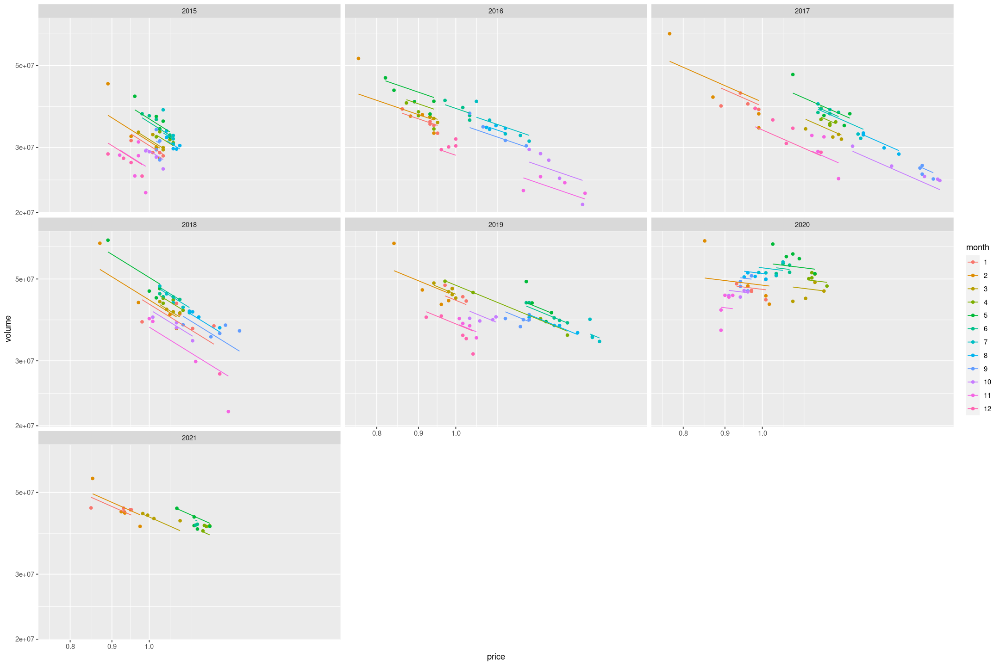

In [168]:
uscavos %>%
add_predictions(fit_price_per_year) %>%
mutate(pred = exp(pred)) %>%
arrange(date) %>%
gf_point(volume ~ price | year, col=~month) %>%
gf_line(pred ~ price | year, col=~month) +
scale_x_log10() + scale_y_log10()

In [157]:
fit_price_per_year

stan_glm
 family:       gaussian [identity]
 formula:      log(volume) ~ log(price):year + year + month
 observations: 330
 predictors:   25
------
                    Median MAD_SD
(Intercept)         17.2    0.0  
year2016             0.1    0.0  
year2017             0.2    0.0  
year2018             0.3    0.0  
year2019             0.4    0.0  
year2020             0.4    0.0  
year2021             0.3    0.0  
month2               0.0    0.0  
month3               0.0    0.0  
month4               0.1    0.0  
month5               0.2    0.0  
month6               0.1    0.0  
month7               0.1    0.0  
month8               0.1    0.0  
month9               0.1    0.0  
month10              0.0    0.0  
month11             -0.1    0.0  
month12             -0.1    0.0  
log(price):year2015 -1.4    0.2  
log(price):year2016 -0.8    0.1  
log(price):year2017 -1.0    0.1  
log(price):year2018 -1.4    0.1  
log(price):year2019 -0.9    0.1  
log(price):year2020 -0.3    0.1  
lo

### Independence of errors

This is a time series so the errors may not be independent, but we've somewhat corrected this by including month and year as factors.

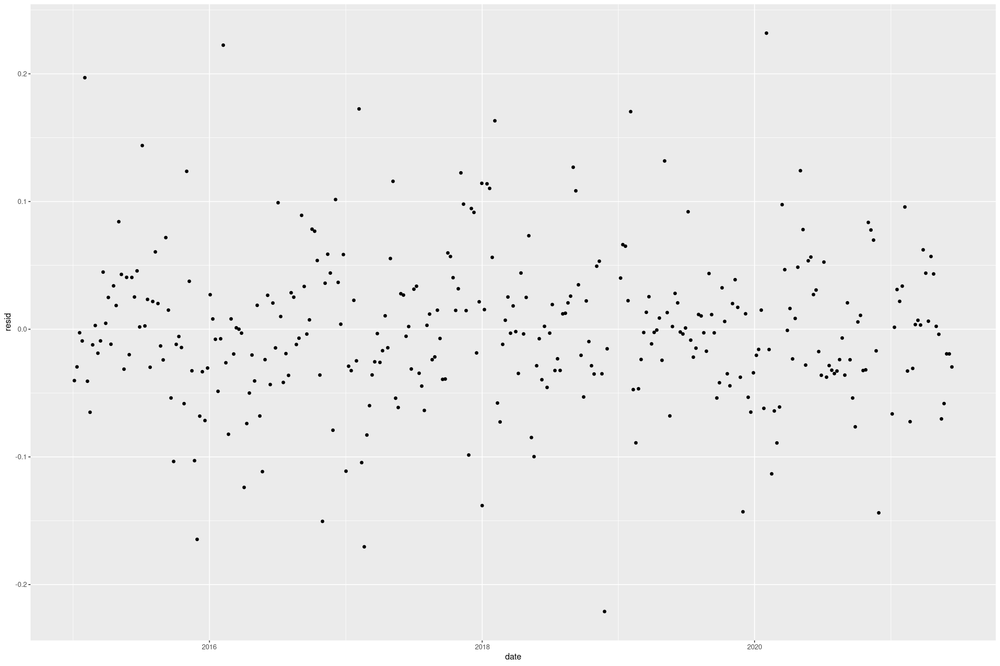

In [179]:
uscavos %>%
add_residuals(fit_price_per_year) %>%
gf_point(resid ~ date)

However if wee look by the week of the month the error pattern seems very different - the errors are not independent!

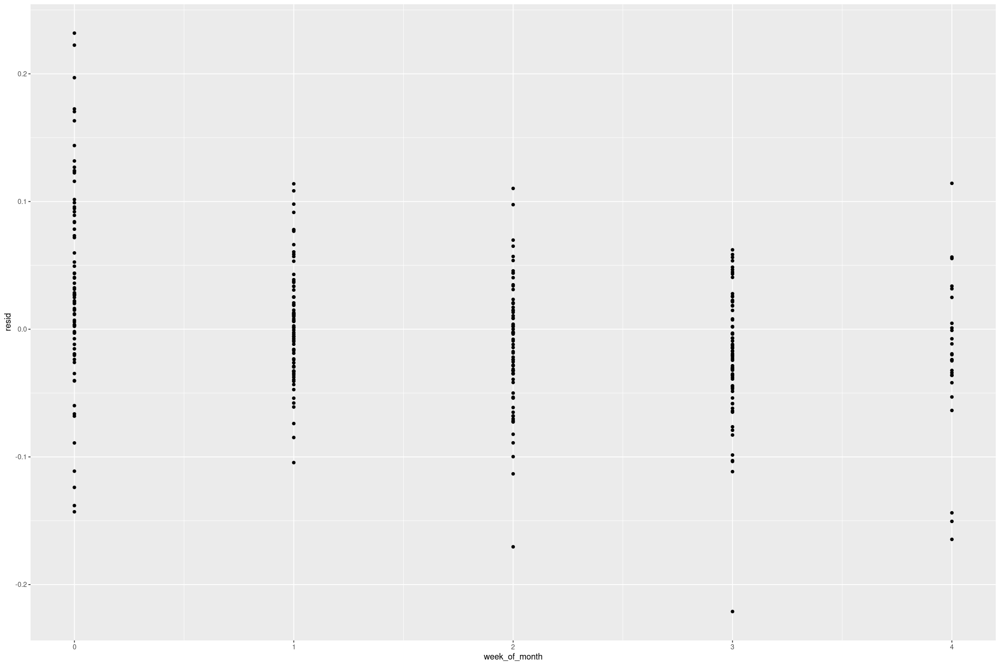

In [178]:
uscavos %>%
add_residuals(fit_price_per_year) %>%
mutate(week_of_month = (floor_date(date, 'month') %--% date) %/% period('week')) %>%
gf_point(resid ~ week_of_month)

### Equal variance of errors

Following up the above it looks like the variance of error depends on the week. So it's not equal.

In [180]:
uscavos %>%
add_residuals(fit_price_per_year) %>%
mutate(week_of_month = (floor_date(date, 'month') %--% date) %/% period('week')) %>%
group_by(week_of_month) %>%
summarise(sd(resid))

week_of_month,sd(resid)
<dbl>,<dbl>
0,0.07662277
1,0.04386349
2,0.04795266
3,0.04679230
4,0.06207932


It also looks like the variance may increase somewhat with the size of the prediction - but it's harder to see.

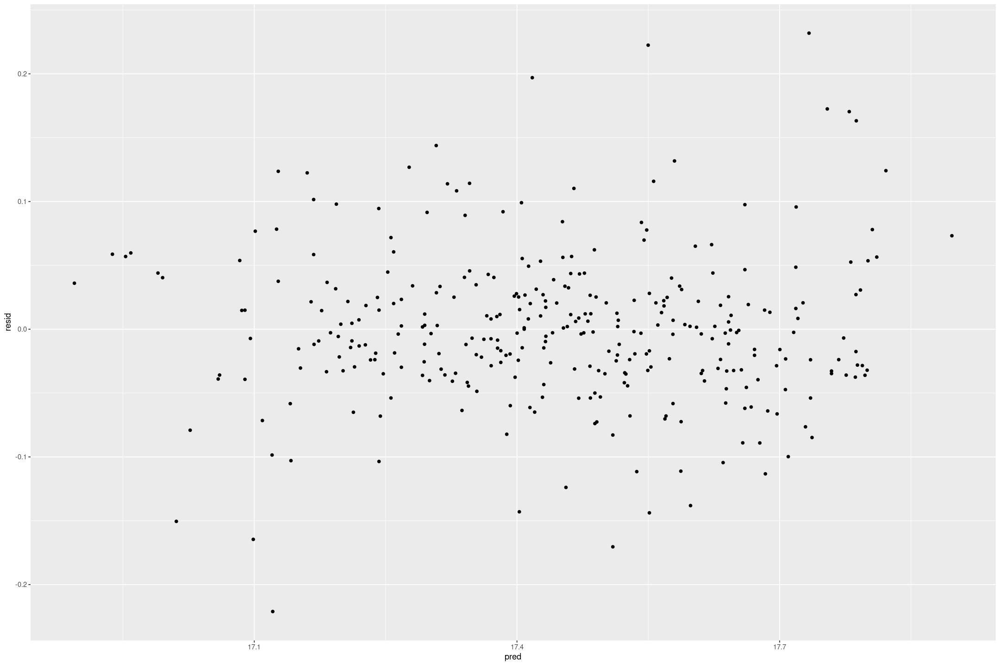

In [181]:
uscavos %>%
add_predictions(fit_price_per_year) %>%
add_residuals(fit_price_per_year) %>%
gf_point(resid ~ pred)

## Normality of Errors

Even with the previous we can still ask overall if the errors are normal.

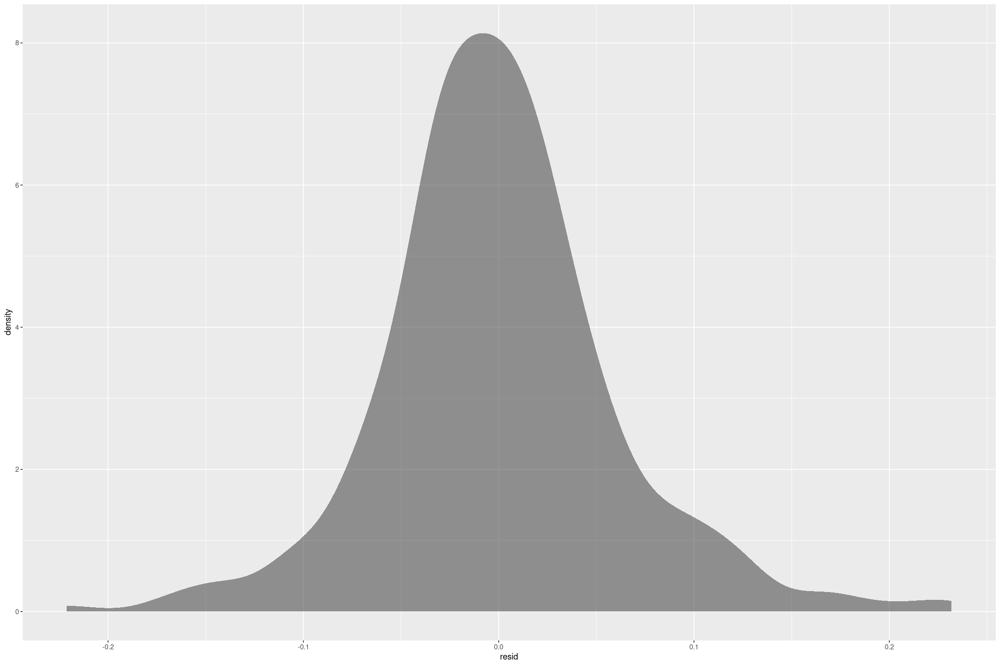

In [188]:
uscavos %>%
add_residuals(fit_price_per_year) %>%
gf_density(~resid, bw="ucv")

It's a little bit narrower with more outliers than a normal distribution.

Is it slightly t-distribution shaped?

In any case this has very little impact on the regression (c.f. Exercise 11.6)

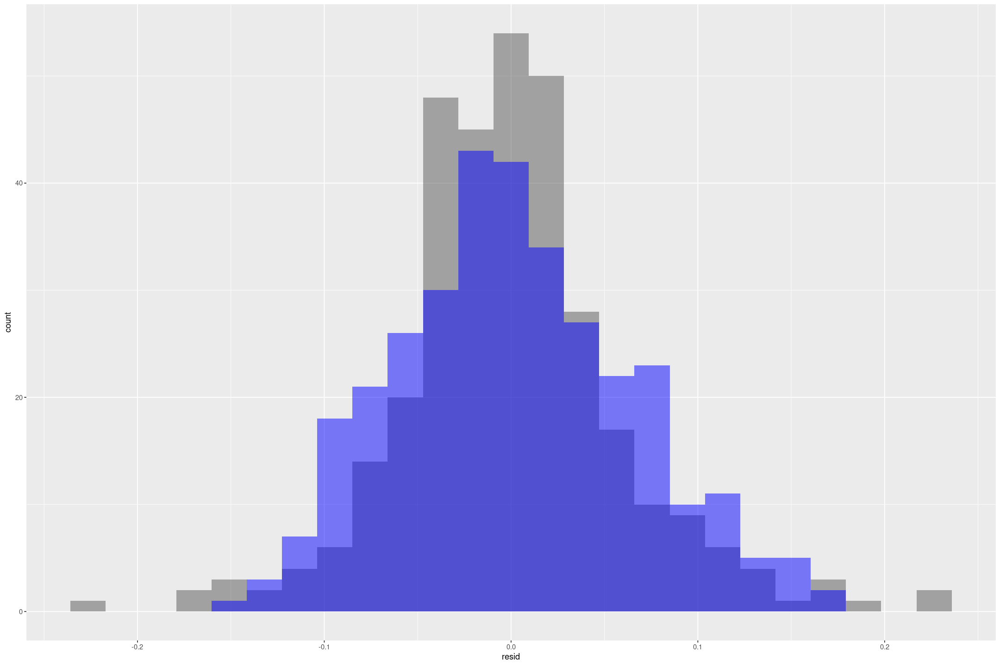

In [192]:
uscavos %>%
add_residuals(fit_price_per_year) %>%
gf_histogram(~resid) %>%
gf_histogram(~rnorm(nrow(uscavos), sd=sd(resid)), fill="blue", alpha=0.5)

# Fitting a transformed model

Fit a linear regression that includes transformation and interpret the estimated parametrs and their uncertainties.
Compare you results to the model you fit in exercise 10.